# Imports

In [1]:
import sys
sys.path.append('../src/')

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import pickle
import joblib
from sklearn.metrics import pairwise_distances
from PIL import Image
from sklearn.metrics import pairwise_distances
from sklearn.cluster import Birch
from sklearn.decomposition import PCA
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix, accuracy_score, recall_score
from sklearn.model_selection import train_test_split
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense
import tensorflow as tf

from DataSetFactory import DataSetFactory
from ClusterPlot import ClusterPlot

In [9]:
RANDOM_STATE = 42
SAMPLE_SIZE=0.1

In [38]:
ds = DataSetFactory.get_dataset('MNIST', sample=SAMPLE_SIZE, random_state=RANDOM_STATE)

In [39]:
X = ds.df[ds.feature_cols].values
y = ds.df[ds.label_col].values

In [40]:
X.shape

(7000, 784)

# BIRCH Threshold

In [5]:
def get_num_clusters_birch(ds, threshold):
    num_clusters = 0
    for label in ds.df[ds.label_col].unique():
        label_data = ds.df[ds.df[ds.label_col]==label][ds.feature_cols].values
        birch = Birch(threshold=threshold, branching_factor=2, n_clusters=None)
        birch.fit(label_data)
        num_clusters += birch.subcluster_centers_.shape[0]
    return num_clusters

def birch_threshold_plot(X, ds):
    dist_mat = pairwise_distances(X)
    print(dist_mat.shape)
    threshold_candidates = np.unique(dist_mat)
    print(threshold_candidates.shape)
    # for the sake of the experiment let's evaluate all of them
    thresholds_df = pd.DataFrame(threshold_candidates, columns=['threshold'])
    thresholds_df['num_clusters'] = np.nan
    thresholds_df['num_points'] = ds.df.shape[0]
    thresholds_df.hist(['threshold'])
    plt.show()
    # Filter only thresholds smaller than 1.5
    thresholds_df_sample = thresholds_df[thresholds_df['threshold']<=6]
    thresholds_df_sample = thresholds_df_sample.sample(n=200, random_state=RANDOM_STATE)
#     thresholds_df_sample = thresholds_df.sample(n=200)
    
    thresholds_df_sample['num_clusters'] = thresholds_df_sample['threshold'].transform(lambda t: get_num_clusters_birch(ds, t))
    thresholds_df_sample['compression'] = thresholds_df_sample['num_points'] / thresholds_df_sample['num_clusters']
    
    sns.lineplot(x='threshold', y='compression', data=thresholds_df_sample)
    sns.lineplot(x='threshold', y='num_clusters', data=thresholds_df_sample)

(7000, 7000)
(19942204,)


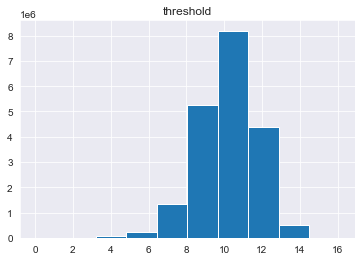

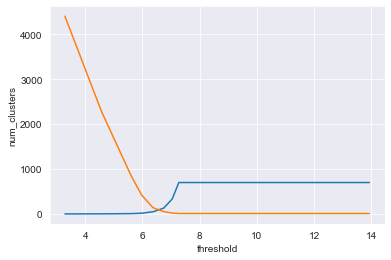

In [7]:
birch_threshold_plot(X, ds)

# UMAP

In [28]:
umap_cp = ClusterPlot(dim_reduction_algo='umap',
            reduce_all_points=True,
            n_iter=1, 
            batch_size=0,
            learning_rate=0.1,
            do_animation=False,
            dataset='MNISTFull',
            class_to_label=ds.class_to_label,
            show_fig=True,
            save_fig=True,
            random_state=RANDOM_STATE,
            show_anchors=False,
            supervised=False,
            show_points=True,
            show_inner_blobs=False,
            show_polygons=False,
            show_label_level_plots=False,
            show_anchor_level_plot=False,
            annotate_images=False,
            birch_threshold=14,
            umap_min_dist=0.1)
print(umap_cp)

AMAP
addr:@2f8c88
verbose=True
n_components=2
anchors_method='birch'
n_intra_anchors=None
birch_threshold=14
birch_branching_factor=None
dim_reduction_algo='umap'
supervised=False
umap_n_neighbors=15
umap_min_dist=0.1
reduce_all_points=True
uniform_points_per='anchor'
k=20
proximity_k=3
self_relation=False
radius_q=None
do_relaxation=True
top_greedy=1
magnitude_step=False
n_iter=1
batch_size=0
stop_criteria=1e-05
loss_func=<function AMAP.l_inf_loss at 0x00000201F833FA68>
loss='Linf'
only_inter_relations=False
learning_rate=0.1
mask_sparse_subcluster=None
random_points_method='voronoi'
class_to_label={8: 'Digit_8', 4: 'Digit_4', 7: 'Digit_7', 0: 'Digit_0', 6: 'Digit_6', 2: 'Digit_2', 3: 'Digit_3', 9: 'Digit_9', 5: 'Digit_5', 1: 'Digit_1'}
random_state=42
n_jobs=None
dataset='MNISTFull'
show_fig=True
save_fig=True
is_plotly=False
do_animation=False
use_spline=False
alpha=None
douglas_peucker_tolerance=0.6
smooth_iter=3
skip_polygons_with_area=0.01
mask_relation_in_same_label=True
save_fi

finding intra class anchors using birch
UnSupervised Dim Reduction
Dim Reduction all points


C:\Users\omalkai\AppData\Local\Continuum\anaconda3_new\lib\site-packages\numba\compiler.py:602: NumbaPerformanceWarning:


The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "..\..\..\..\..\..\AppData\Local\Continuum\anaconda3_new\lib\site-packages\umap\nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^




Starting iteration 1 loss = 0.23468494147785995


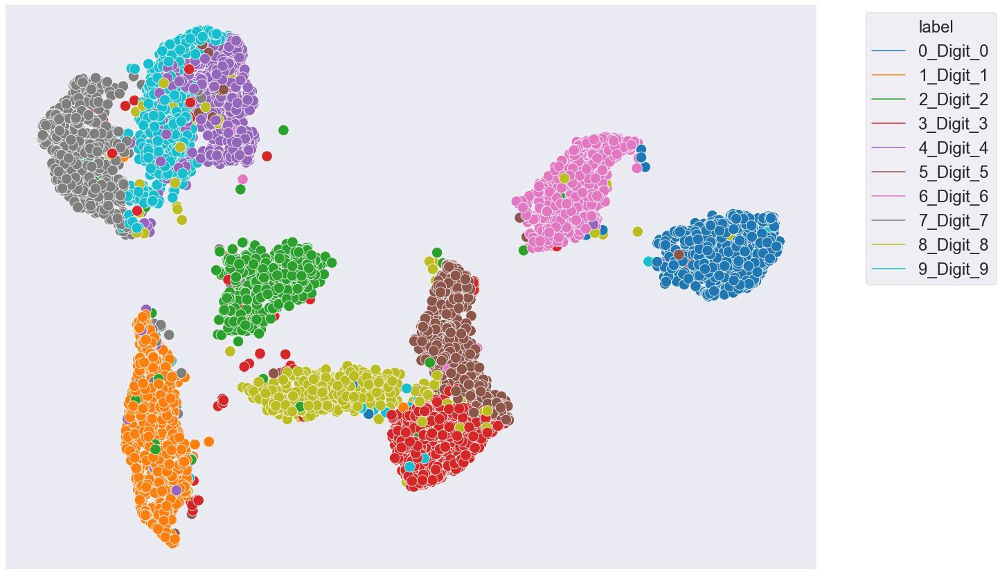

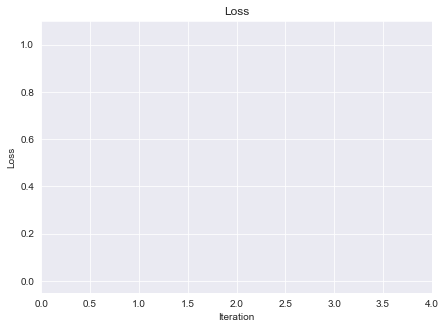

In [29]:
#min_dist = 0.11
umap_low_dim = umap_cp.fit_transform(X, y)

finding intra class anchors using birch
UnSupervised Dim Reduction
Dim Reduction all points


C:\Users\omalkai\AppData\Local\Continuum\anaconda3_new\lib\site-packages\numba\compiler.py:602: NumbaPerformanceWarning:


The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "..\..\..\..\..\..\AppData\Local\Continuum\anaconda3_new\lib\site-packages\umap\rp_tree.py", line 135:
@numba.njit(fastmath=True, nogil=True, parallel=True)
def euclidean_random_projection_split(data, indices, rng_state):
^


C:\Users\omalkai\AppData\Local\Continuum\anaconda3_new\lib\site-packages\numba\compiler.py:602: NumbaPerformanceWarning:


The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "..\..\..\..\.

Starting iteration 1 loss = 0.24561317315469886


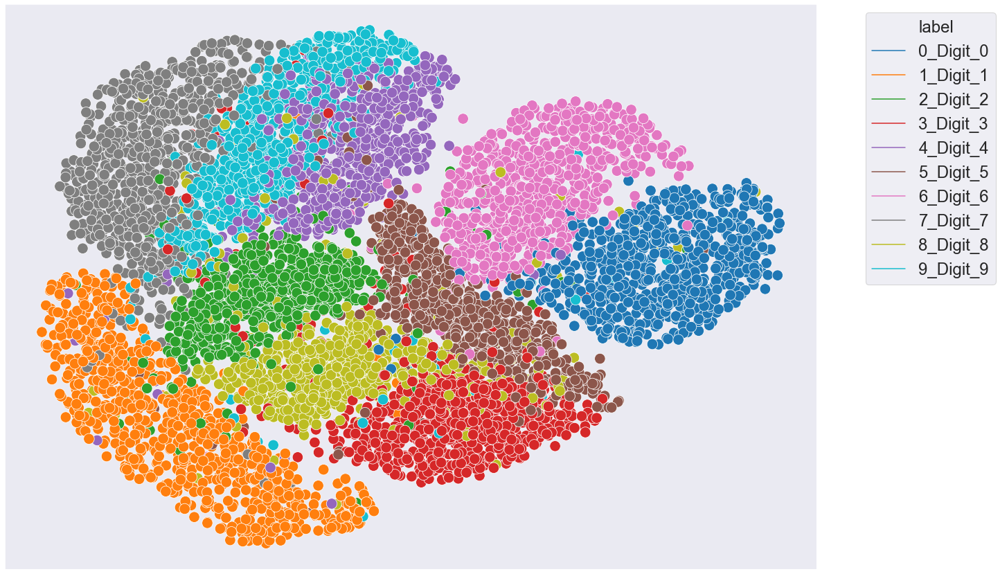

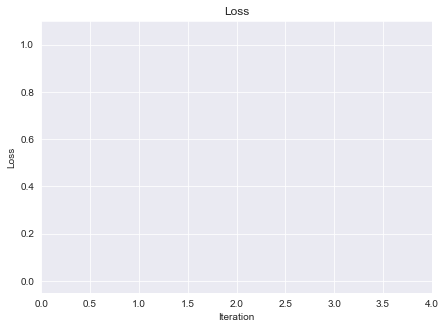

In [27]:
#min_dist = 1
umap_low_dim = umap_cp.fit_transform(X, y)

# ClusterPlot

In [30]:
blobs_cp = ClusterPlot(reduce_all_points=False,
                  n_iter=1, 
                  batch_size=0,
                  learning_rate=0.1,
                  dataset='MNISTFull',
                  class_to_label=ds.class_to_label,
                  show_fig=True,
                  save_fig=True,
                  random_state=RANDOM_STATE,
                  show_anchors=False,
                  supervised=False,
                  show_points=False,
                  show_inner_blobs=False,
                  show_polygons=True,
                  show_label_level_plots=True,
                  show_anchor_level_plot=False,
                  save_fig_every=10,
                  annotate_images=False,
                  birch_threshold=4,
                  alpha=[
                        1.3,
                        0,
                        1,
                        1.2,
                        1.2,
                        1,
                        0.8,
                        1.2,
                        1.5,
                        1
                    ],
                  douglas_peucker_tolerance=0.8,
                  smooth_iter=3,
                  magnitude_step=False,
                  only_inter_relations=False,
                  mask_relation_in_same_label=True,
                  skip_polygons_with_area = 0.1,
                  umap_min_dist=0.1)
print(blobs_cp)

AMAP
addr:@102708
verbose=True
n_components=2
anchors_method='birch'
n_intra_anchors=None
birch_threshold=4
birch_branching_factor=None
dim_reduction_algo='umap'
supervised=False
umap_n_neighbors=15
umap_min_dist=0.1
reduce_all_points=False
uniform_points_per='anchor'
k=20
proximity_k=3
self_relation=False
radius_q=None
do_relaxation=True
top_greedy=1
magnitude_step=False
n_iter=1
batch_size=0
stop_criteria=1e-05
loss_func=<function AMAP.l_inf_loss at 0x00000201F833FA68>
loss='Linf'
only_inter_relations=False
learning_rate=0.1
mask_sparse_subcluster=None
random_points_method='voronoi'
class_to_label={8: 'Digit_8', 4: 'Digit_4', 7: 'Digit_7', 0: 'Digit_0', 6: 'Digit_6', 2: 'Digit_2', 3: 'Digit_3', 9: 'Digit_9', 5: 'Digit_5', 1: 'Digit_1'}
random_state=42
n_jobs=None
dataset='MNISTFull'
show_fig=True
save_fig=True
is_plotly=False
do_animation=False
use_spline=False
alpha=[1.3, 0, 1, 1.2, 1.2, 1, 0.8, 1.2, 1.5, 1]
douglas_peucker_tolerance=0.8
smooth_iter=3
skip_polygons_with_area=0.1
mas

finding intra class anchors using birch
UnSupervised Dim Reduction
Dim Reduction only anchors
Dim Reduction only anchors - generate random points in low dim per anchor


 19%|██████████████▉                                                              | 1868/9643 [00:05<00:27, 283.00it/s]

anchor 298 has no voronoi region, why? returning anchor instead of random point - probably not error


100%|█████████████████████████████████████████████████████████████████████████████| 9643/9643 [00:28<00:00, 336.65it/s]


Starting iteration 1 loss = 1.0
Skipping polygon of label 0 with area 0.008708387657629824
Skipping polygon of label 0 with area 0.0001671871811153025
Skipping polygon of label 0 with area 0.0001671871811153025
Skipping polygon of label 0 with area 0.0018227206436286503
Skipping polygon of label 5 with area 0.0001671871811153025
Skipping polygon of label 5 with area 0.00016719116717212046
Skipping polygon of label 6 with area 0.00016719116717212046
Skipping polygon of label 6 with area 0.00016719116717212046
Skipping polygon of label 8 with area 0.0007747699053304302
Skipping polygon of label 8 with area 0.000167188177629507


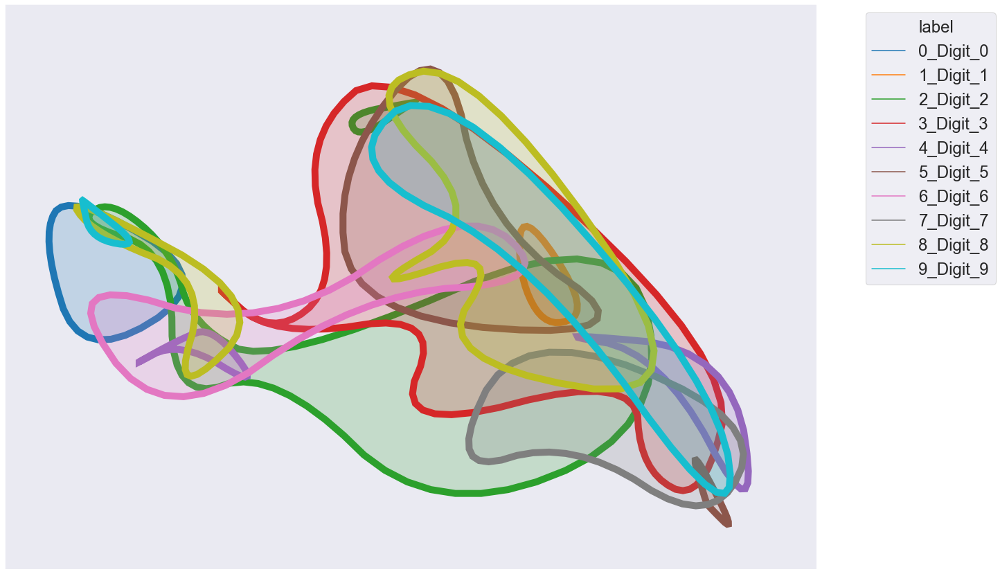

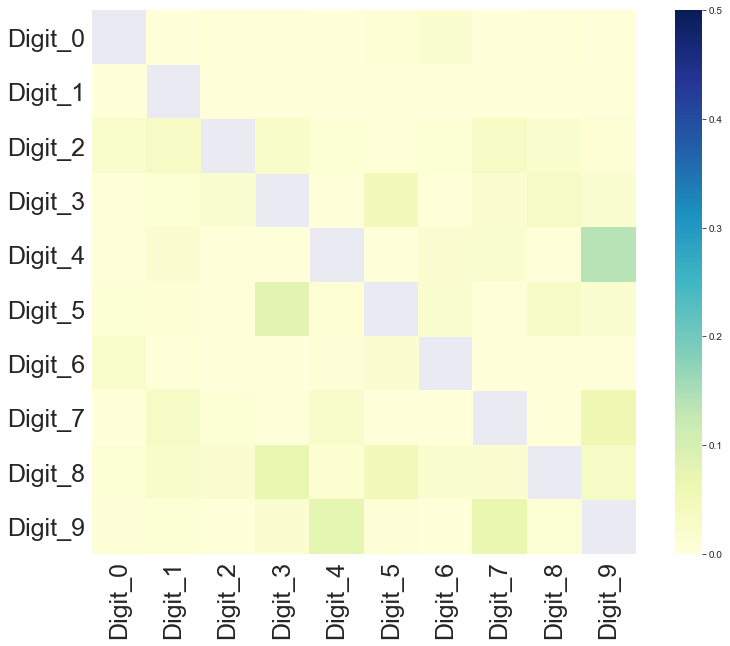

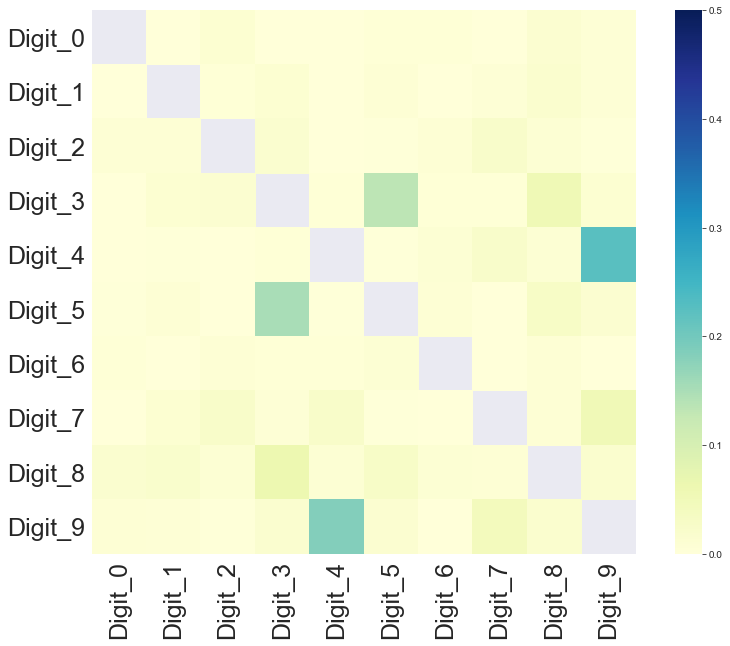

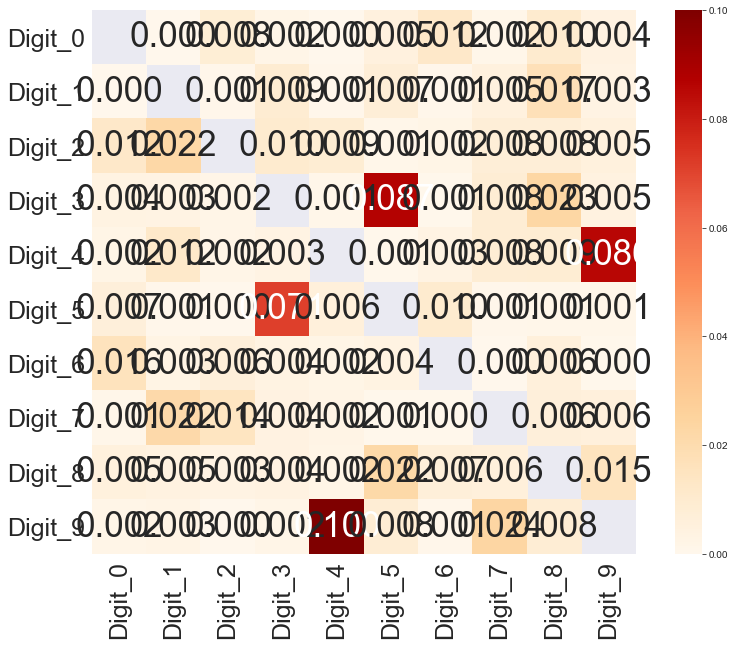

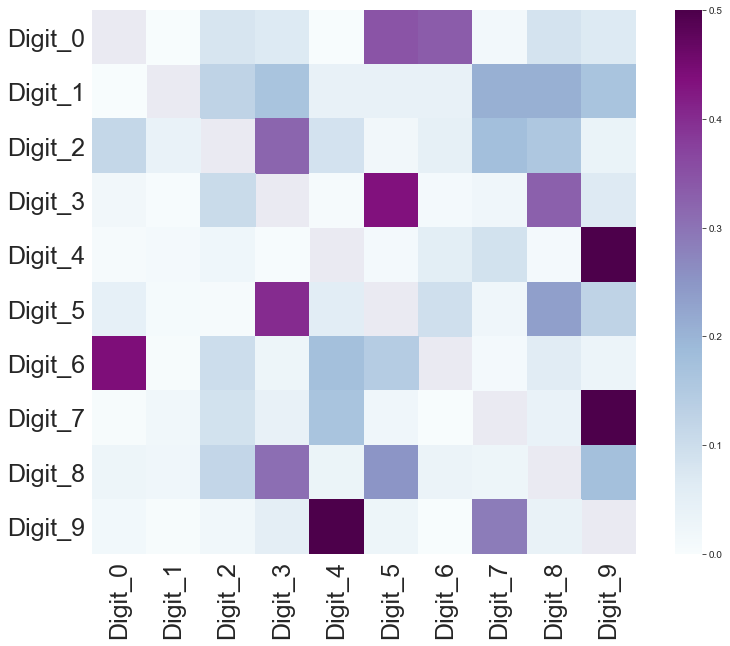

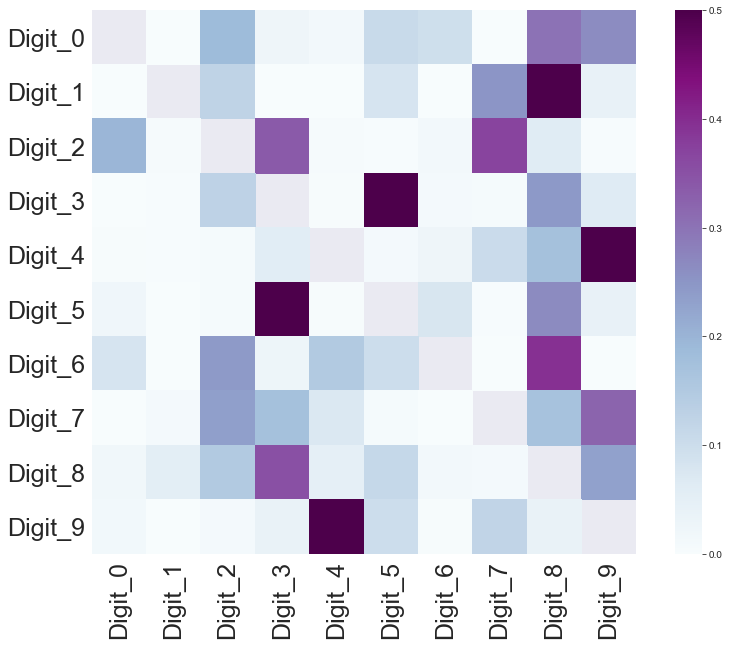

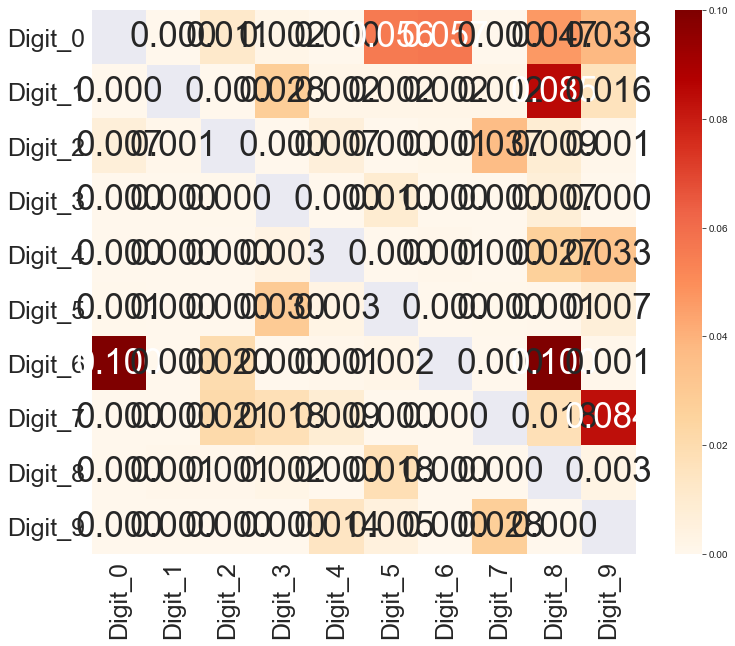

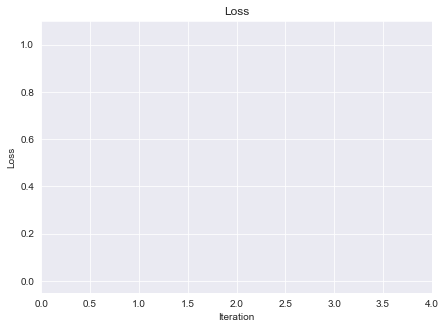

In [31]:
# umap_min_dist=0.1
low_sim_blobs = blobs_cp.fit_transform(X, y)

finding intra class anchors using birch
UnSupervised Dim Reduction
Dim Reduction only anchors
Dim Reduction only anchors - generate random points in low dim per anchor


100%|█████████████████████████████████████████████████████████████████████████████| 9643/9643 [01:17<00:00, 124.79it/s]


Starting iteration 1 loss = 1.0
Skipping polygon of label 0 with area 0.0001671871811153025
Skipping polygon of label 0 with area 0.0001671871811153025
Skipping polygon of label 0 with area 0.0001671871811153025
Skipping polygon of label 0 with area 0.0001671871811153025
Skipping polygon of label 2 with area 0.00016719116717212046
Skipping polygon of label 2 with area 0.00016719116717212046
Skipping polygon of label 2 with area 0.00016719116717212046
Skipping polygon of label 2 with area 0.00016719141630661127
Skipping polygon of label 2 with area 0.0001671951533239735
Skipping polygon of label 2 with area 0.00016719116717212046
Skipping polygon of label 2 with area 0.00016719116717212046
Skipping polygon of label 3 with area 0.009456676898498273
Skipping polygon of label 3 with area 0.007575914162217186
Skipping polygon of label 3 with area 0.0065533509518599375
Skipping polygon of label 3 with area 0.00016719129173936587
Skipping polygon of label 3 with area 0.00016719116717212046
Sk

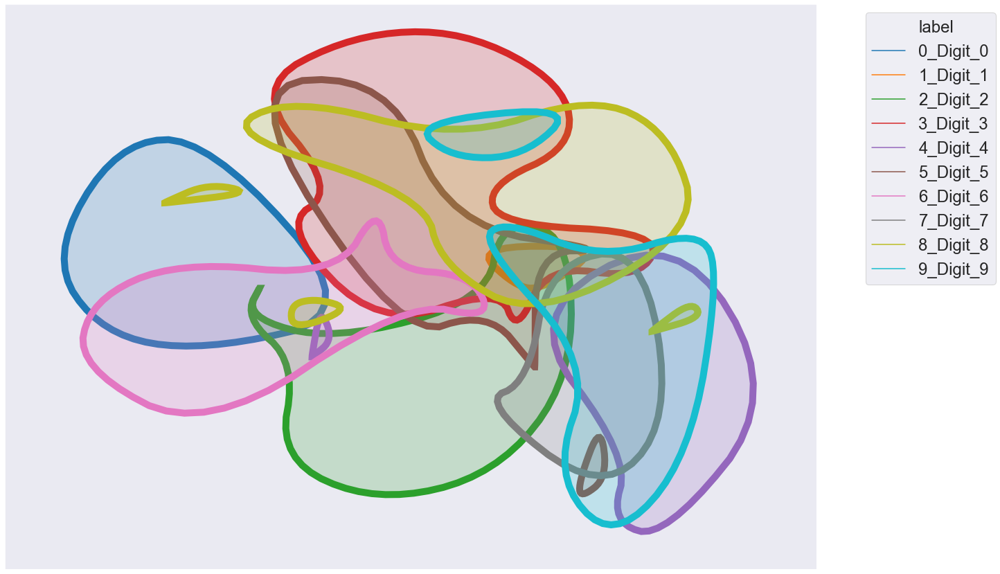

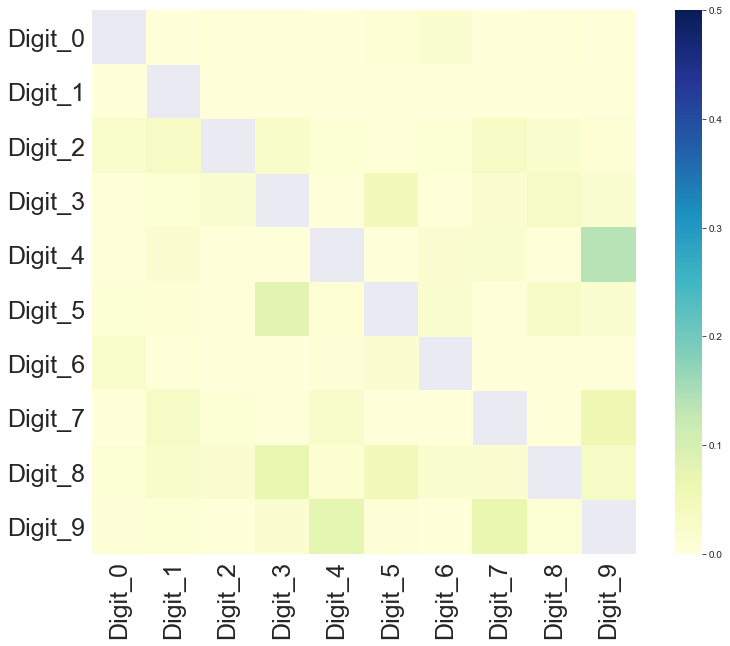

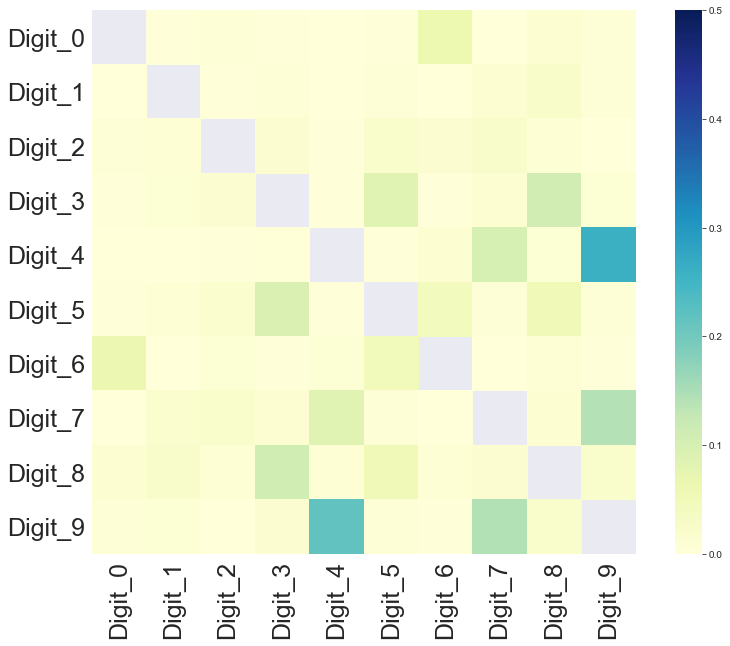

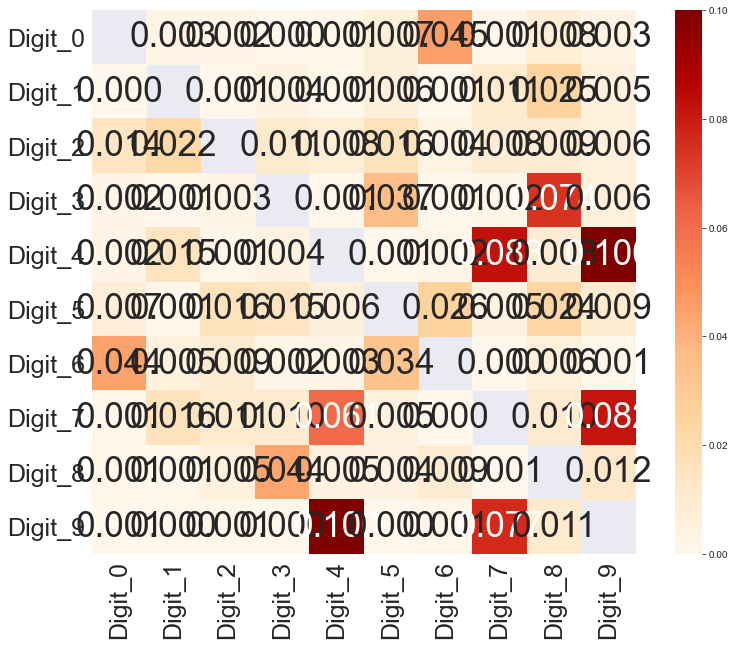

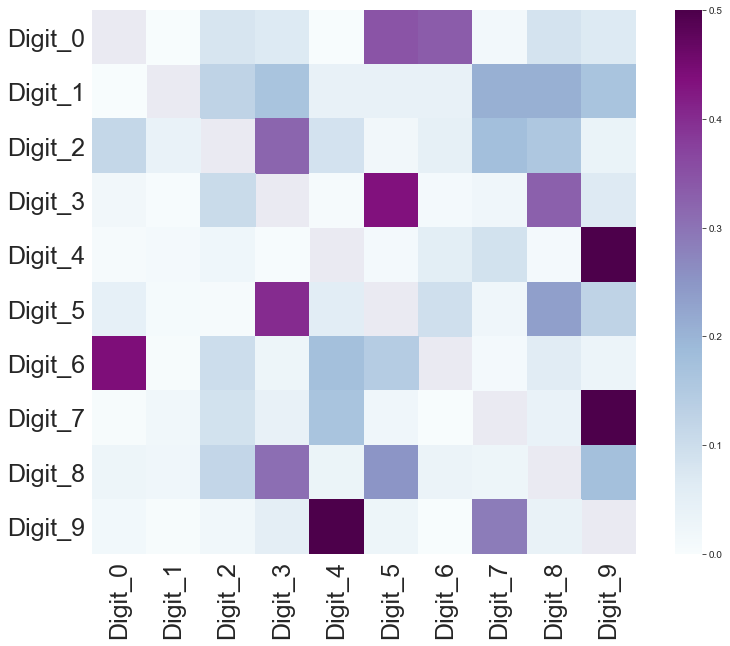

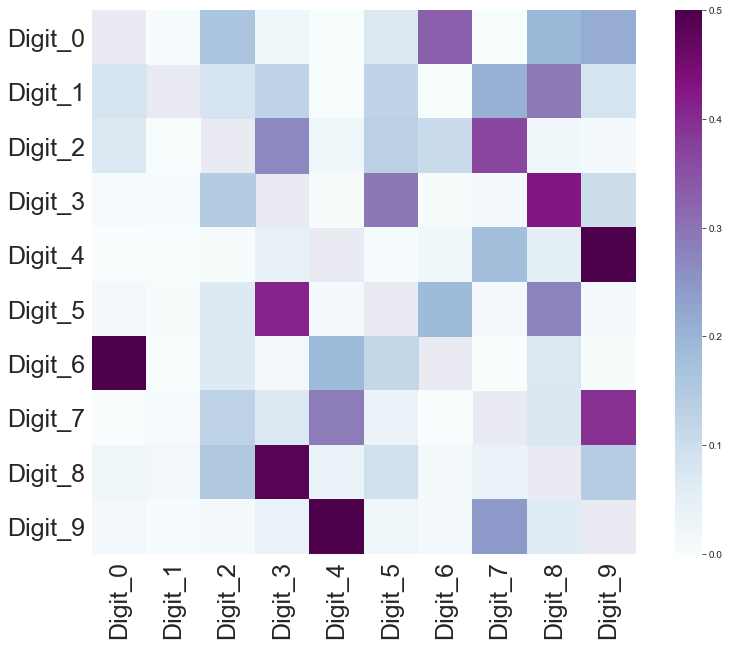

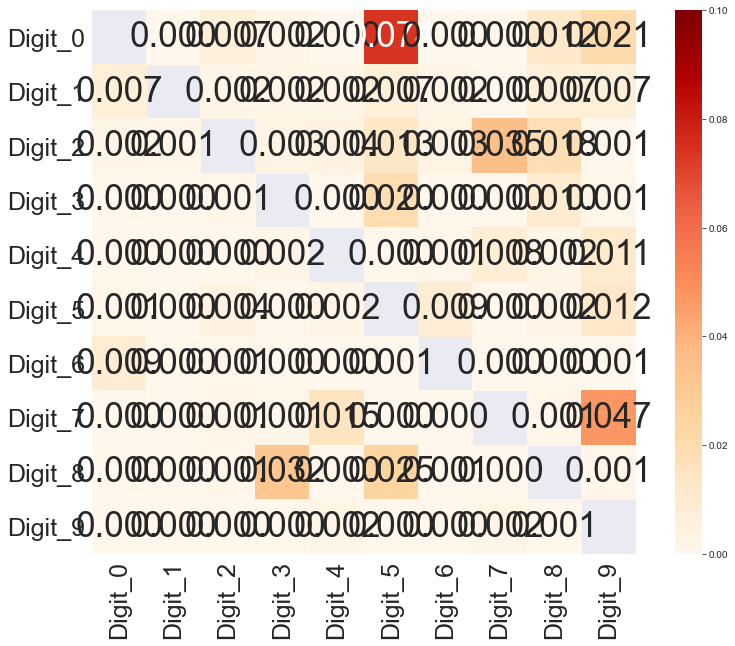

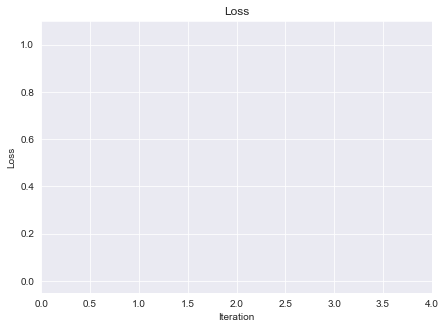

In [8]:
# umap_min_dist=1
low_sim_blobs = blobs_cp.fit_transform(X, y)

Skipping polygon of label 0 with area 0.0001671871811153025
Skipping polygon of label 0 with area 0.0001671871811153025
Skipping polygon of label 0 with area 0.0001671871811153025
Skipping polygon of label 0 with area 0.0001671871811153025
Skipping polygon of label 2 with area 0.01598654574226735
Skipping polygon of label 2 with area 0.00016719116717212046
Skipping polygon of label 2 with area 0.00016719116717212046
Skipping polygon of label 2 with area 0.00016719116717212046
Skipping polygon of label 2 with area 0.00016719141630661127
Skipping polygon of label 2 with area 0.0001671951533239735
Skipping polygon of label 2 with area 0.00016719116717212046
Skipping polygon of label 2 with area 0.00016719116717212046
Skipping polygon of label 3 with area 0.013741201144379378
Skipping polygon of label 3 with area 0.0001671871811153025
Skipping polygon of label 3 with area 0.0065533509518599375
Skipping polygon of label 3 with area 0.00016718730567957807
Skipping polygon of label 3 with are

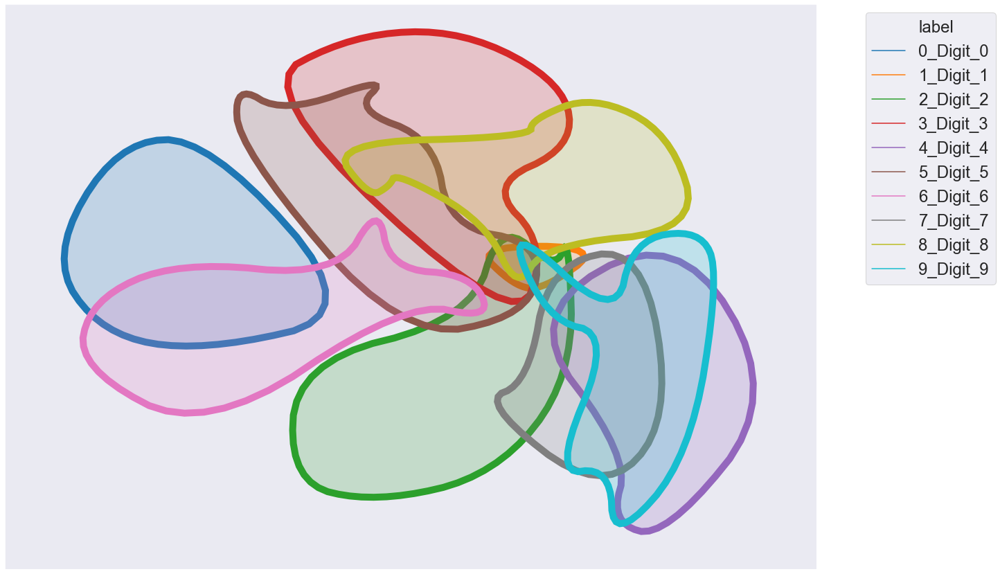

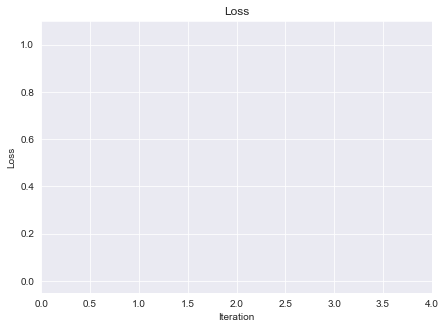

In [25]:
blobs_cp.show_anchors = False
blobs_cp.show_polygons = True
blobs_cp.show_label_level_plots=False
blobs_cp.douglas_peucker_tolerance = 0.8
blobs_cp.skip_polygons_with_area = 0.8
blobs_cp.alpha = [
    1.3,
    0,
    1.3,
    1.7,
    1.2,
    1.5,
    0.8,
    1.2,
    2.8,
    2.3
]
blobs_cp.anchors_plot_sns_separate(1, True)

# Same Net

In [10]:
ds_32_64_1000 = DataSetFactory.get_dataset('MNIST-DEEP-32-64-1000-985', random_state=RANDOM_STATE)
ds_32_64_750 = DataSetFactory.get_dataset('MNIST-DEEP-32-64-750-984', random_state=RANDOM_STATE)
ds_32_64_200 = DataSetFactory.get_dataset('MNIST-DEEP-32-64-200-96', random_state=RANDOM_STATE)
ds_32_64_9 = DataSetFactory.get_dataset('MNIST-DEEP-32-64-9-80', random_state=RANDOM_STATE)
ds_32_64_3 = DataSetFactory.get_dataset('MNIST-DEEP-32-64-3-64', random_state=RANDOM_STATE)

In [11]:
X_32_64_1000 = ds_32_64_1000.df[ds_32_64_1000.feature_cols].values
y_32_64_1000 = ds_32_64_1000.df[ds_32_64_1000.label_col].values

X_32_64_750 = ds_32_64_750.df[ds_32_64_750.feature_cols].values
y_32_64_750 = ds_32_64_750.df[ds_32_64_750.label_col].values

X_32_64_200 = ds_32_64_200.df[ds_32_64_200.feature_cols].values
y_32_64_200 = ds_32_64_200.df[ds_32_64_200.label_col].values

X_32_64_9 = ds_32_64_9.df[ds_32_64_9.feature_cols].values
y_32_64_9 = ds_32_64_9.df[ds_32_64_9.label_col].values

X_32_64_3 = ds_32_64_3.df[ds_32_64_3.feature_cols].values
y_32_64_3 = ds_32_64_3.df[ds_32_64_3.label_col].values

(10000, 10000)
(12491377,)


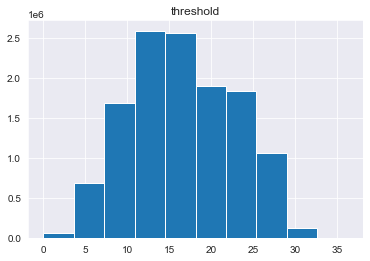

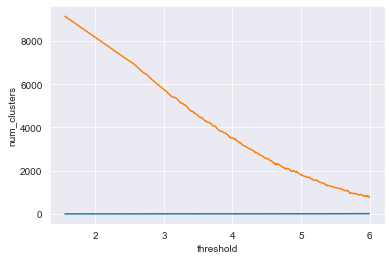

In [11]:
birch_threshold_plot(X_32_64_1000, ds_32_64_1000)

(10000, 10000)
(12548446,)


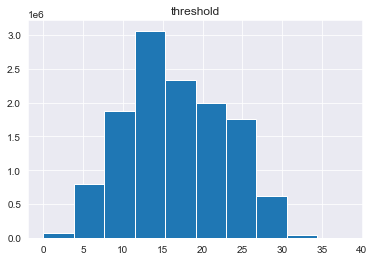

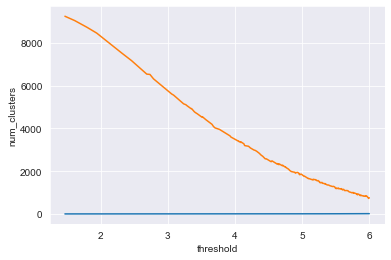

In [12]:
birch_threshold_plot(X_32_64_750, ds_32_64_750)

(10000, 10000)
(13012657,)


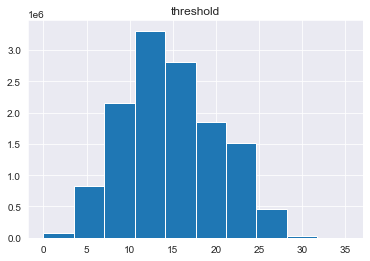

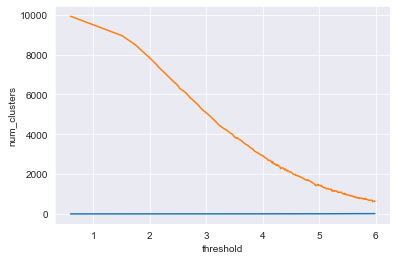

In [13]:
birch_threshold_plot(X_32_64_200, ds_32_64_200)

(10000, 10000)
(14649959,)


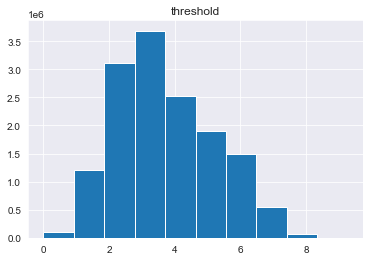

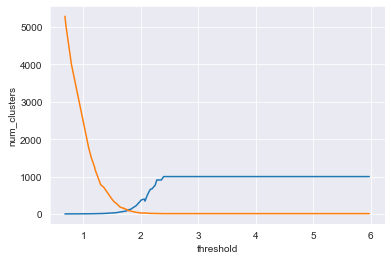

In [12]:
birch_threshold_plot(X_32_64_9, ds_32_64_9)

(10000, 10000)
(13258103,)


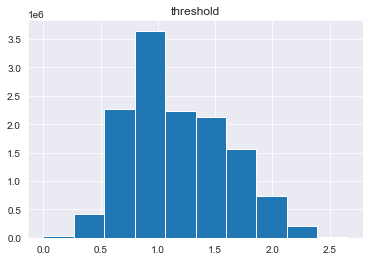

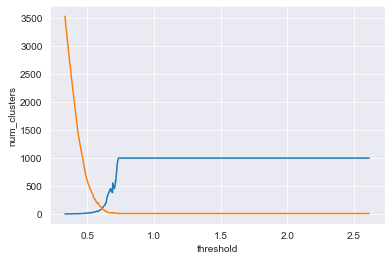

In [13]:
birch_threshold_plot(X_32_64_3, ds_32_64_3)

## 1000 epochs

AMAP
addr:@a3f6c8
verbose=True
n_components=2
anchors_method='birch'
n_intra_anchors=None
birch_threshold=4
birch_branching_factor=None
dim_reduction_algo='umap'
supervised=False
umap_n_neighbors=15
umap_min_dist=0.1
reduce_all_points=False
uniform_points_per='anchor'
k=20
proximity_k=3
self_relation=False
radius_q=None
do_relaxation=True
top_greedy=1
magnitude_step=False
n_iter=1
batch_size=0
stop_criteria=1e-05
loss_func=<function AMAP.l_inf_loss at 0x000001852ED97EE8>
loss='Linf'
only_inter_relations=False
learning_rate=0.1
mask_sparse_subcluster=None
random_points_method='voronoi'
class_to_label={7: 'Digit_7', 2: 'Digit_2', 1: 'Digit_1', 0: 'Digit_0', 4: 'Digit_4', 9: 'Digit_9', 5: 'Digit_5', 6: 'Digit_6', 3: 'Digit_3', 8: 'Digit_8'}
random_state=42
n_jobs=None
dataset='MNISTFull'
show_fig=True
save_fig=True
is_plotly=False
do_animation=False
use_spline=False
alpha=[1, 0, 3, 2, 1, 3.5, 1, 3, 4.5, 4]
douglas_peucker_tolerance=0.1
smooth_iter=3
skip_polygons_with_area=0.1
mask_relati

100%|███████████████████████████████████████████████████████████████████████████| 12512/12512 [01:08<00:00, 182.37it/s]


Starting iteration 1 loss = 0.9473684210526315
Skipping polygon of label 0 with area 0.005537985067812556
Skipping polygon of label 0 with area 0.017400280015632957
Skipping polygon of label 0 with area 0.0001671871811153025
Skipping polygon of label 0 with area 0.00016719116717212046
Skipping polygon of label 2 with area 0.05065660240526071
Skipping polygon of label 2 with area 0.0027496674789873055
Skipping polygon of label 2 with area 0.0038951906667286096
Skipping polygon of label 2 with area 0.0001671871811153025
Skipping polygon of label 2 with area 0.005058106799138429
Skipping polygon of label 2 with area 0.00016719116717212046
Skipping polygon of label 3 with area 0.00016719116717212046
Skipping polygon of label 3 with area 0.00016719116717212046
Skipping polygon of label 3 with area 0.004268039944137381
Skipping polygon of label 3 with area 0.0001671871811153025
Skipping polygon of label 3 with area 0.0001671871811153025
Skipping polygon of label 3 with area 0.000167187181115

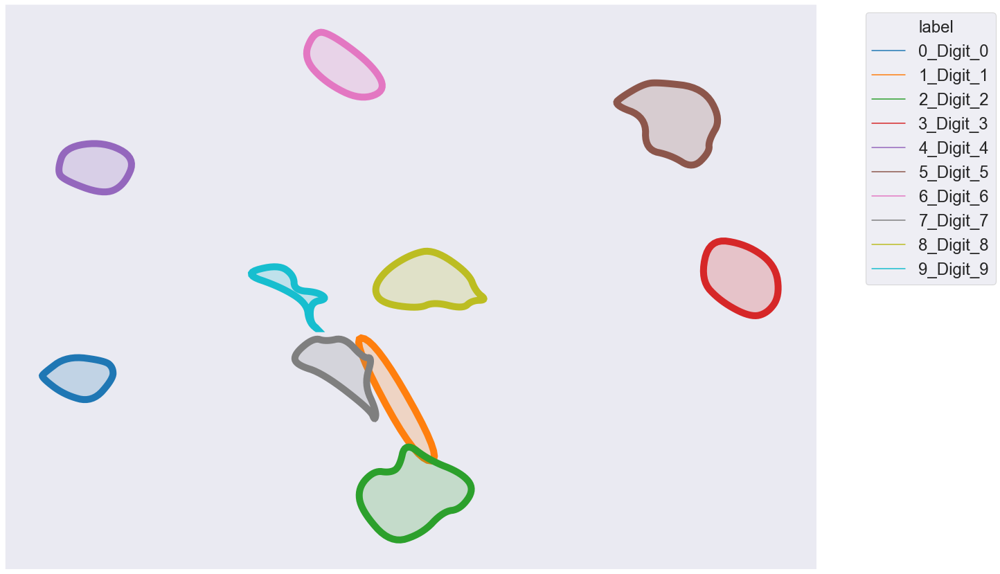

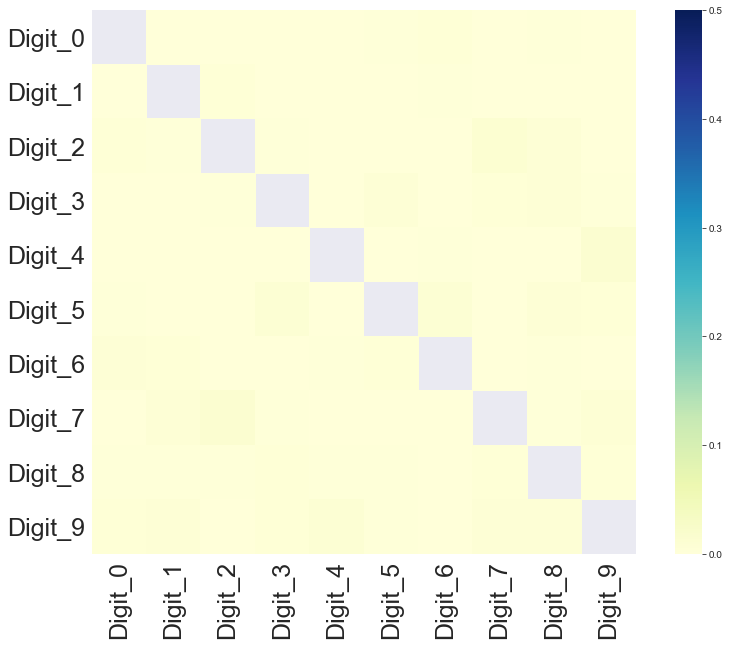

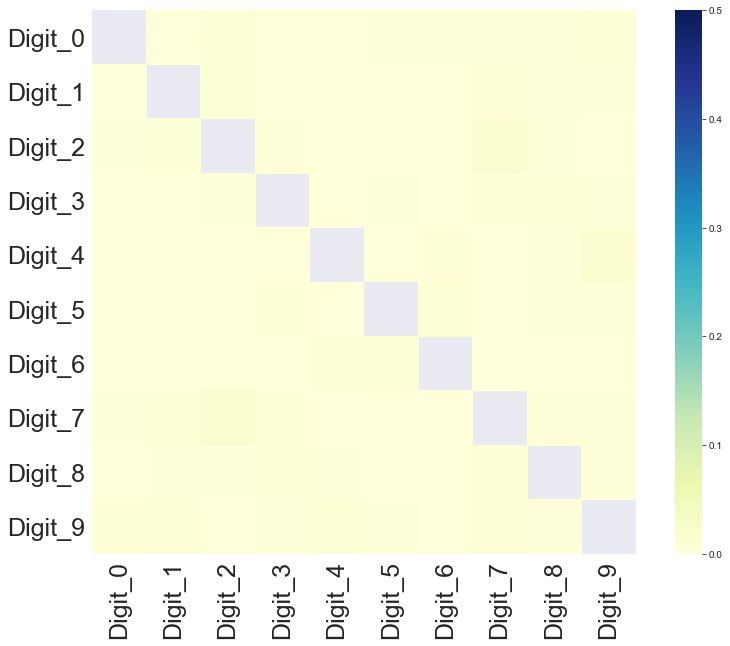

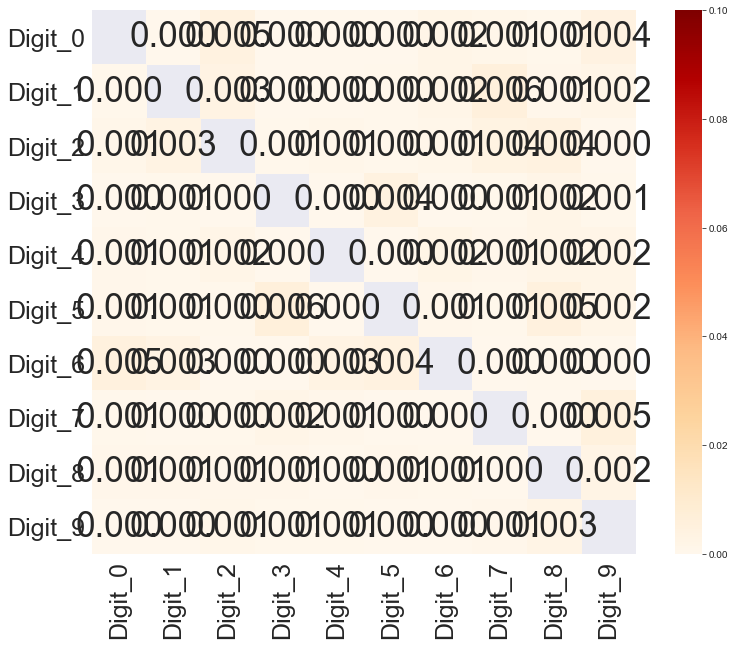

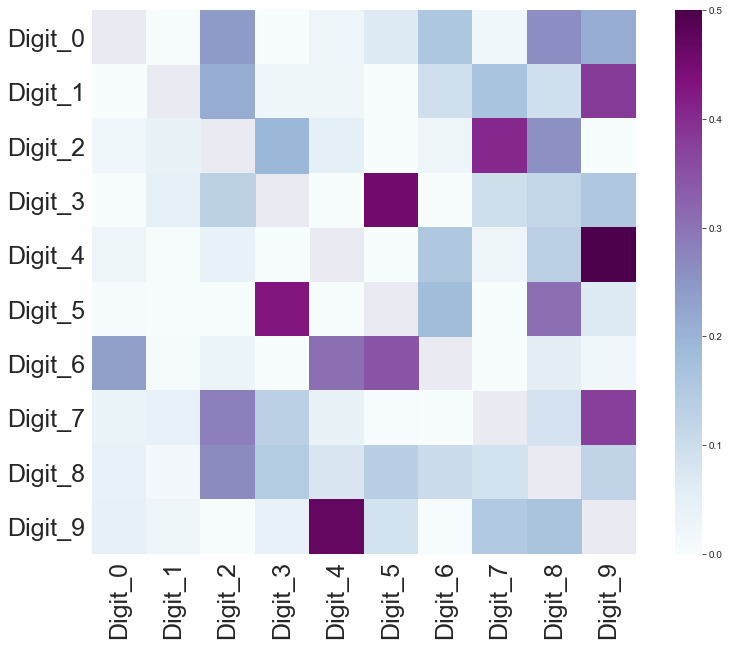

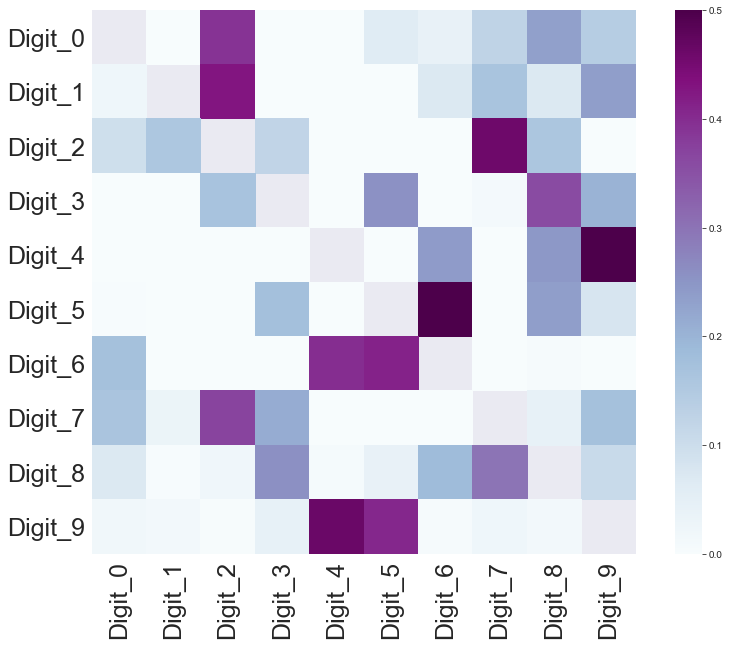

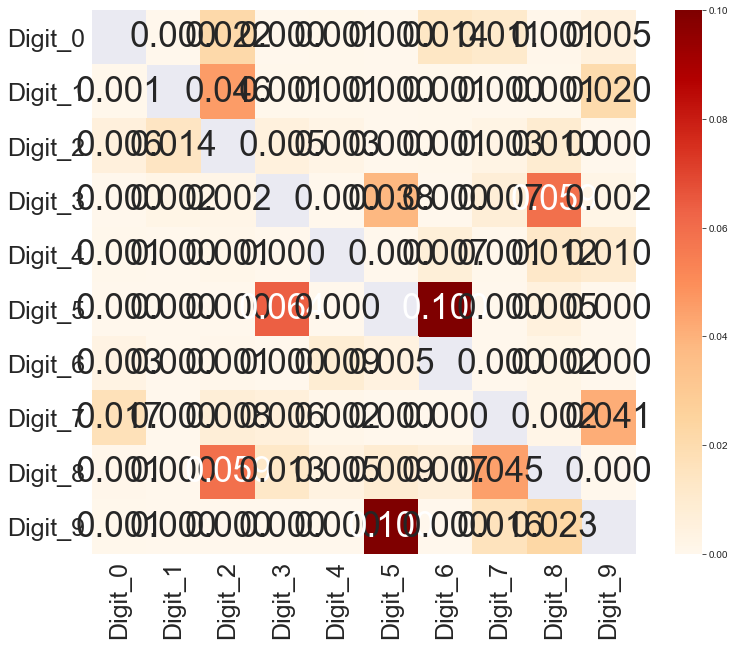

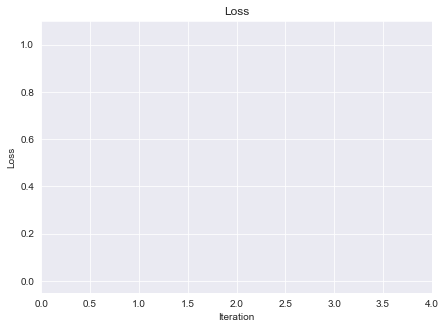

In [32]:
blobs_cp_1000 = ClusterPlot(reduce_all_points=False,
                  n_iter=1, 
                  batch_size=0,
                  learning_rate=0.1,
                  dataset='MNISTFull',
                  class_to_label=ds_32_64_1000.class_to_label,
                  show_fig=True,
                  save_fig=True,
                  random_state=RANDOM_STATE,
                  show_anchors=False,
                  supervised=False,
                  show_points=False,
                  show_inner_blobs=False,
                  show_polygons=True,
                  show_label_level_plots=True,
                  show_anchor_level_plot=False,
                  save_fig_every=10,
                  annotate_images=False,
                  birch_threshold=4,
                  alpha=[
                        1,
                        0,
                        3,
                        2,
                        1,
                        3.5,
                        1,
                        3,
                        4.5,
                        4,
                    ],
                  douglas_peucker_tolerance=0.1,
                  smooth_iter=3,
                  magnitude_step=False,
                  only_inter_relations=False,
                  mask_relation_in_same_label=True,
                  skip_polygons_with_area = 0.1,
                  umap_min_dist=0.1)
print(blobs_cp_1000)
_ = blobs_cp_1000.fit_transform(X_32_64_1000, y_32_64_1000)

## 750 Epochs - Not in USE

AMAP
addr:@654ac8
verbose=True
n_components=2
anchors_method='birch'
n_intra_anchors=None
birch_threshold=4
birch_branching_factor=None
dim_reduction_algo='umap'
supervised=False
umap_n_neighbors=15
umap_min_dist=0.1
reduce_all_points=False
uniform_points_per='anchor'
k=20
proximity_k=3
self_relation=False
radius_q=None
do_relaxation=True
top_greedy=1
magnitude_step=False
n_iter=1
batch_size=0
stop_criteria=1e-05
loss_func=<function AMAP.l_inf_loss at 0x000001852ED97EE8>
loss='Linf'
only_inter_relations=False
learning_rate=0.1
mask_sparse_subcluster=None
random_points_method='voronoi'
class_to_label={7: 'Digit_7', 2: 'Digit_2', 1: 'Digit_1', 0: 'Digit_0', 4: 'Digit_4', 9: 'Digit_9', 5: 'Digit_5', 6: 'Digit_6', 3: 'Digit_3', 8: 'Digit_8'}
random_state=42
n_jobs=None
dataset='MNISTFull'
show_fig=True
save_fig=True
is_plotly=False
do_animation=False
use_spline=False
alpha=[1, 0, 3, 2, 1, 3.5, 1, 3, 4.5, 4]
douglas_peucker_tolerance=0.1
smooth_iter=3
skip_polygons_with_area=0.1
mask_relati

 47%|████████████████████████████████████▏                                        | 5874/12483 [00:52<01:22, 79.88it/s]

anchor 1964 has no voronoi region, why? returning anchor instead of random point - probably not error


100%|███████████████████████████████████████████████████████████████████████████| 12483/12483 [01:44<00:00, 119.44it/s]


Starting iteration 1 loss = 0.7058823529411765
Skipping polygon of label 0 with area 0.00016719116717212046
Skipping polygon of label 0 with area 0.004456699265945344
Skipping polygon of label 2 with area 0.00016719116717212046
Skipping polygon of label 2 with area 0.07109229735931522
Skipping polygon of label 2 with area 0.00016719116717212046
Skipping polygon of label 2 with area 0.00016719116717212046
Skipping polygon of label 2 with area 0.0001671871811153025
Skipping polygon of label 2 with area 0.00016719116717212046
Skipping polygon of label 2 with area 0.002319458336825342
Skipping polygon of label 2 with area 0.00016719116717212046
Skipping polygon of label 2 with area 0.0012706074294603908
Skipping polygon of label 2 with area 0.03987972778080273
Skipping polygon of label 3 with area 0.0001671871811153025
Skipping polygon of label 3 with area 0.00016718730567957807
Skipping polygon of label 3 with area 0.00016719141630661127
Skipping polygon of label 4 with area 0.01274290695

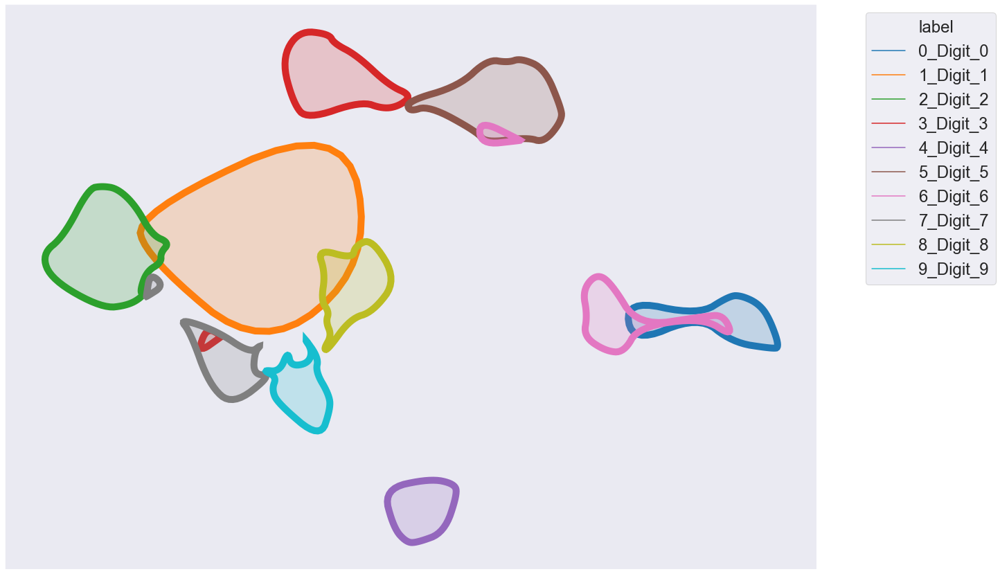

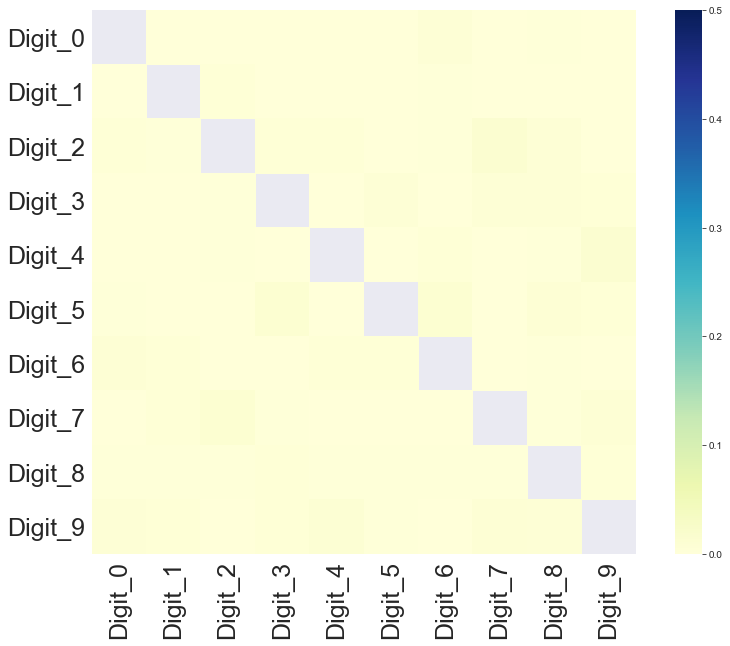

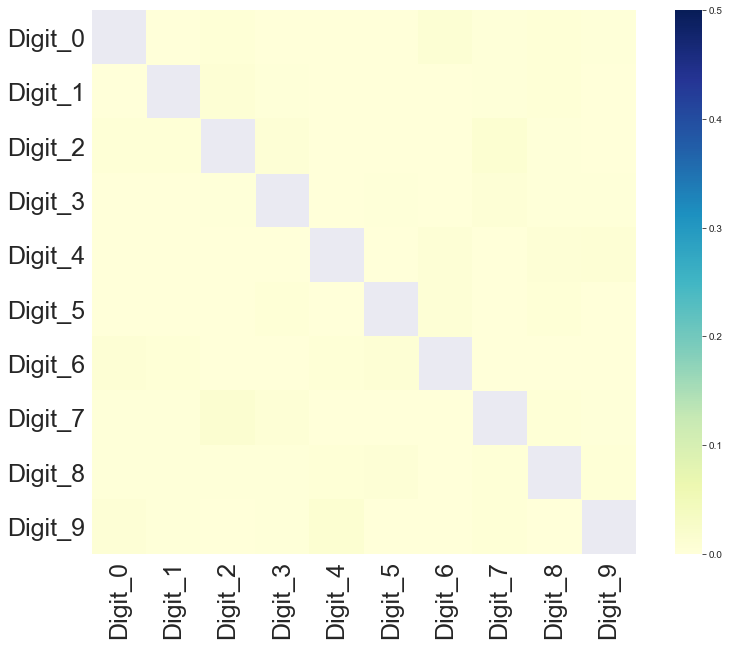

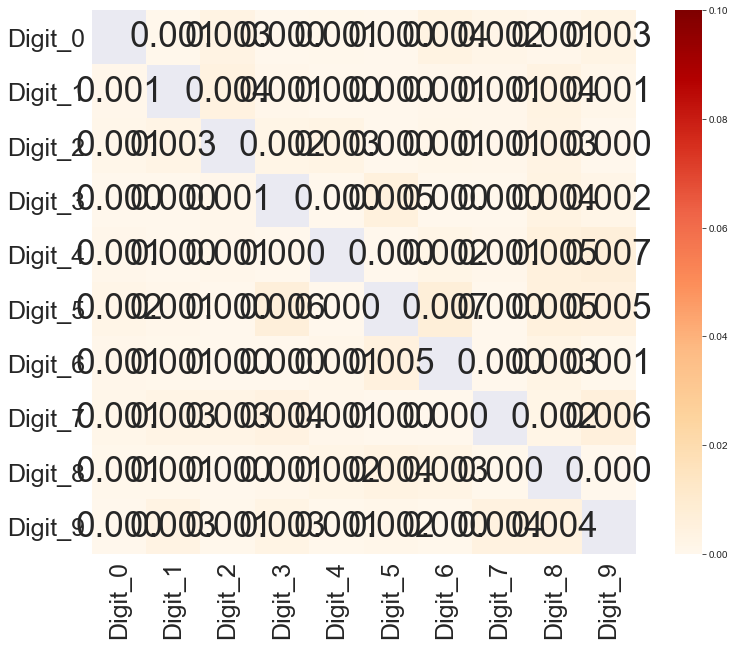

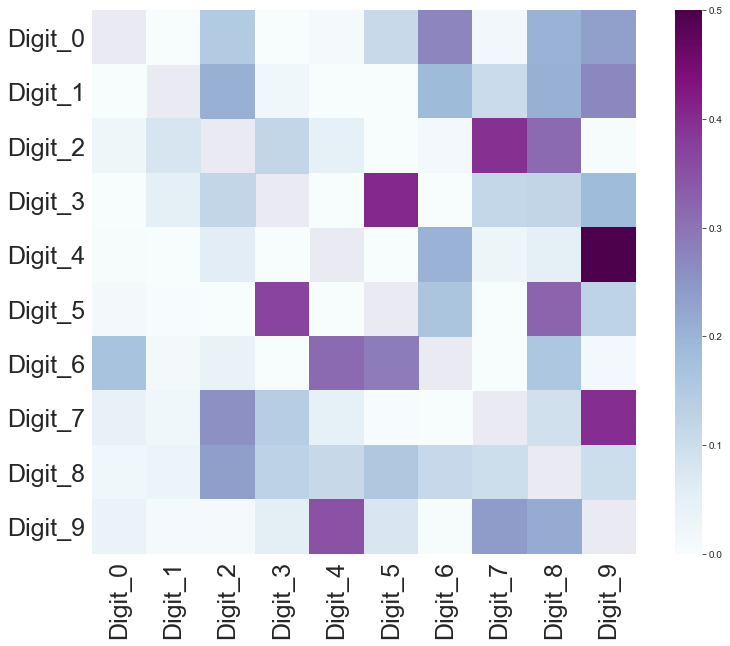

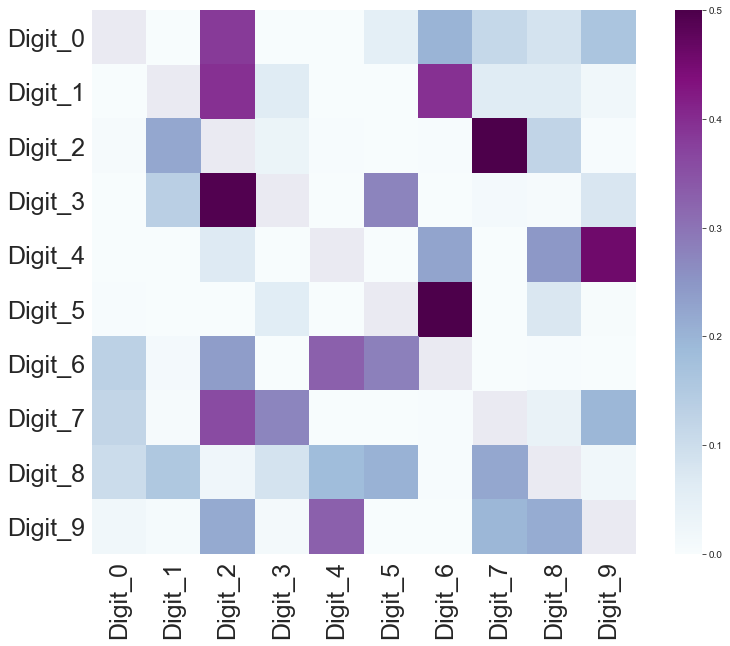

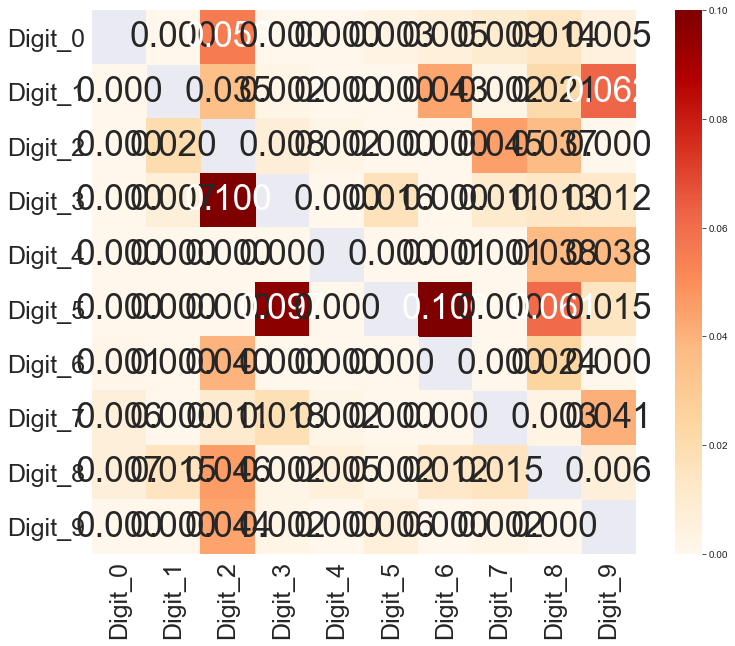

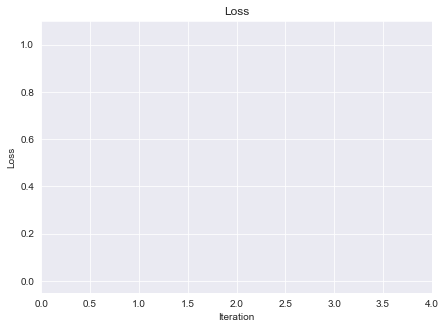

In [33]:
blobs_cp_750 = ClusterPlot(reduce_all_points=False,
                  n_iter=1, 
                  batch_size=0,
                  learning_rate=0.1,
                  dataset='MNISTFull',
                  class_to_label=ds_32_64_750.class_to_label,
                  show_fig=True,
                  save_fig=True,
                  random_state=RANDOM_STATE,
                  show_anchors=False,
                  supervised=False,
                  show_points=False,
                  show_inner_blobs=False,
                  show_polygons=True,
                  show_label_level_plots=True,
                  show_anchor_level_plot=False,
                  save_fig_every=10,
                  annotate_images=False,
                  birch_threshold=4,
                  alpha=[
                        1,
                        0,
                        3,
                        2,
                        1,
                        3.5,
                        1,
                        3,
                        4.5,
                        4,
                    ],
                  douglas_peucker_tolerance=0.1,
                  smooth_iter=3,
                  magnitude_step=False,
                  only_inter_relations=False,
                  mask_relation_in_same_label=True,
                  skip_polygons_with_area = 0.1,
                  umap_min_dist=0.1)
print(blobs_cp_750)
_ = blobs_cp_750.fit_transform(X_32_64_750, y_32_64_750)

Skipping polygon of label 0 with area 0.00016719116717212046
Skipping polygon of label 0 with area 0.004456699265945344
Skipping polygon of label 2 with area 0.00016719116717212046
Skipping polygon of label 2 with area 0.07109229735931522
Skipping polygon of label 2 with area 0.00016719116717212046
Skipping polygon of label 2 with area 0.00016719116717212046
Skipping polygon of label 2 with area 0.0001671871811153025
Skipping polygon of label 2 with area 0.00016719116717212046
Skipping polygon of label 2 with area 0.002319458336825342
Skipping polygon of label 2 with area 0.00016719116717212046
Skipping polygon of label 2 with area 0.0012706074294603908
Skipping polygon of label 2 with area 0.03987972778080273
Skipping polygon of label 3 with area 0.0001671871811153025
Skipping polygon of label 3 with area 0.00016718730567957807
Skipping polygon of label 3 with area 0.00016719141630661127
Skipping polygon of label 4 with area 0.012742906954373074
Skipping polygon of label 4 with area 0

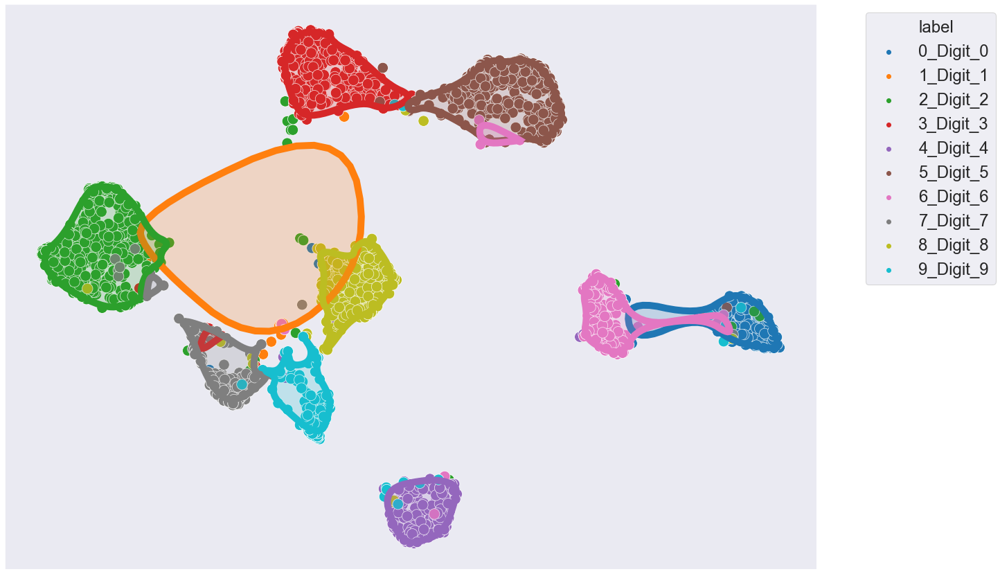

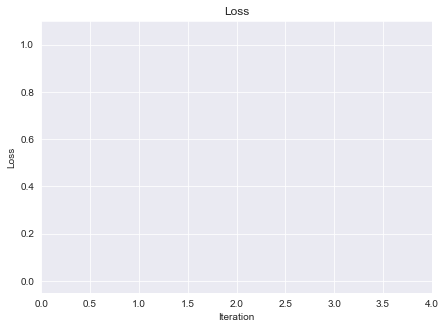

In [17]:
# blobs_cp_750.show_anchors=True
# blobs_cp_750.show_label_level_plots=False
# blobs_cp_750.show_polygons=True
# blobs_cp_750.douglas_peucker_tolerance=0.1
# blobs_cp_750.alpha = [
#     1,
#     0,
#     3,
#     2,
#     1,
#     3.5,
#     1,
#     3,
#     4.5,
#     4,
# ]
# blobs_cp_750.anchors_plot_sns_separate(1, True)

## 200 Epochs

AMAP
addr:@634808
verbose=True
n_components=2
anchors_method='birch'
n_intra_anchors=None
birch_threshold=3.5
birch_branching_factor=None
dim_reduction_algo='umap'
supervised=False
umap_n_neighbors=15
umap_min_dist=0.1
reduce_all_points=False
uniform_points_per='anchor'
k=20
proximity_k=3
self_relation=False
radius_q=None
do_relaxation=True
top_greedy=1
magnitude_step=False
n_iter=1
batch_size=0
stop_criteria=1e-05
loss_func=<function AMAP.l_inf_loss at 0x000001852ED97EE8>
loss='Linf'
only_inter_relations=False
learning_rate=0.1
mask_sparse_subcluster=None
random_points_method='voronoi'
class_to_label={7: 'Digit_7', 2: 'Digit_2', 1: 'Digit_1', 0: 'Digit_0', 4: 'Digit_4', 9: 'Digit_9', 5: 'Digit_5', 6: 'Digit_6', 3: 'Digit_3', 8: 'Digit_8'}
random_state=42
n_jobs=None
dataset='MNISTFull'
show_fig=True
save_fig=True
is_plotly=False
do_animation=False
use_spline=False
alpha=[1, 1, 3, 3.5, 1.5, 3.5, 2, 3.2, 3, 3]
douglas_peucker_tolerance=0.5
smooth_iter=3
skip_polygons_with_area=0.2
mask_

100%|███████████████████████████████████████████████████████████████████████████| 12798/12798 [00:45<00:00, 279.20it/s]


Starting iteration 1 loss = 0.7368421052631579
Skipping polygon of label 0 with area 0.0009390586832566106
Skipping polygon of label 0 with area 0.0001671871811153025
Skipping polygon of label 1 with area 0.0001671873523911814
Skipping polygon of label 1 with area 0.052677640002079335
Skipping polygon of label 1 with area 0.02357355053517073
Skipping polygon of label 1 with area 0.09362104021259636
Skipping polygon of label 2 with area 0.0001671871811153025
Skipping polygon of label 2 with area 0.0001671871811153025
Skipping polygon of label 2 with area 0.00016718730567957807
Skipping polygon of label 2 with area 0.09104342049028066
Skipping polygon of label 2 with area 0.0001671871811153025
Skipping polygon of label 2 with area 0.026975701463095025
Skipping polygon of label 2 with area 0.0001671871811153025
Skipping polygon of label 2 with area 0.0001671871811153025
Skipping polygon of label 2 with area 0.03878596907808585
Skipping polygon of label 2 with area 0.00016719116717212046
S

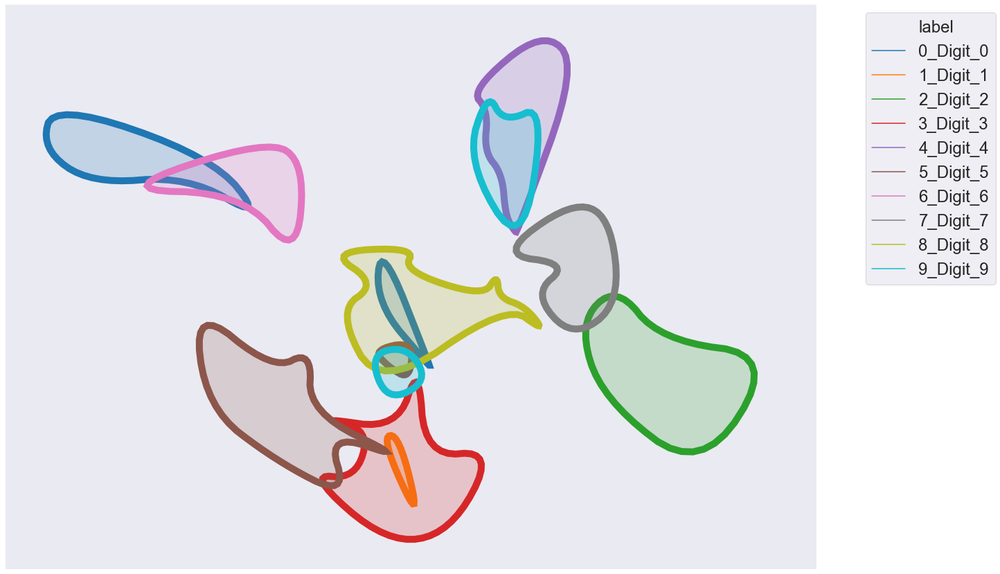

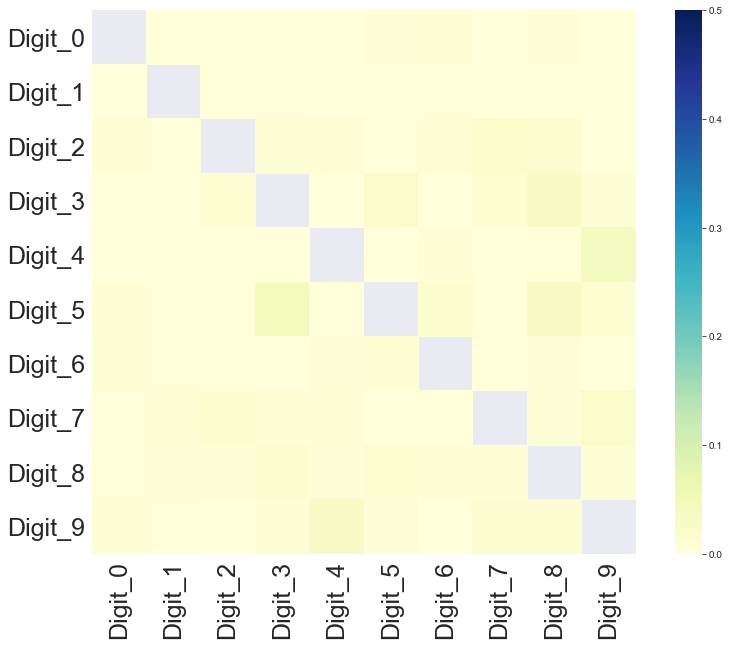

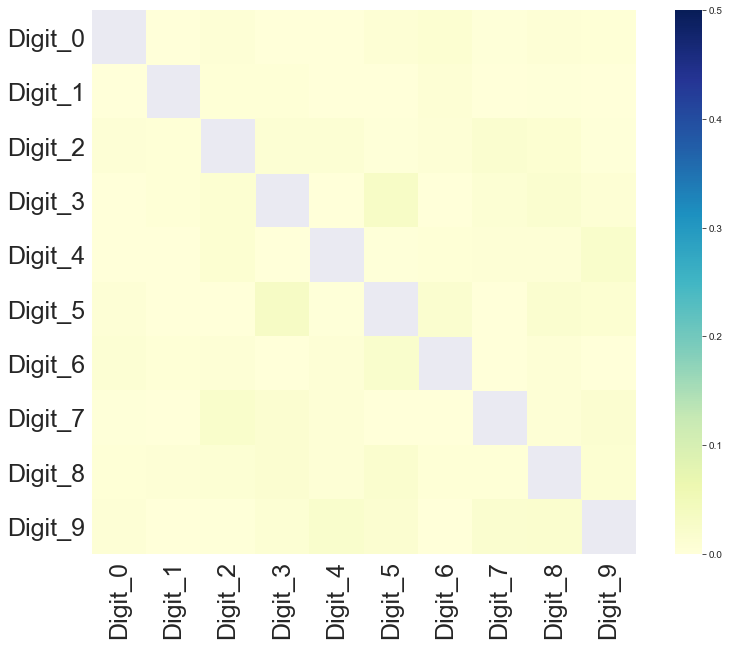

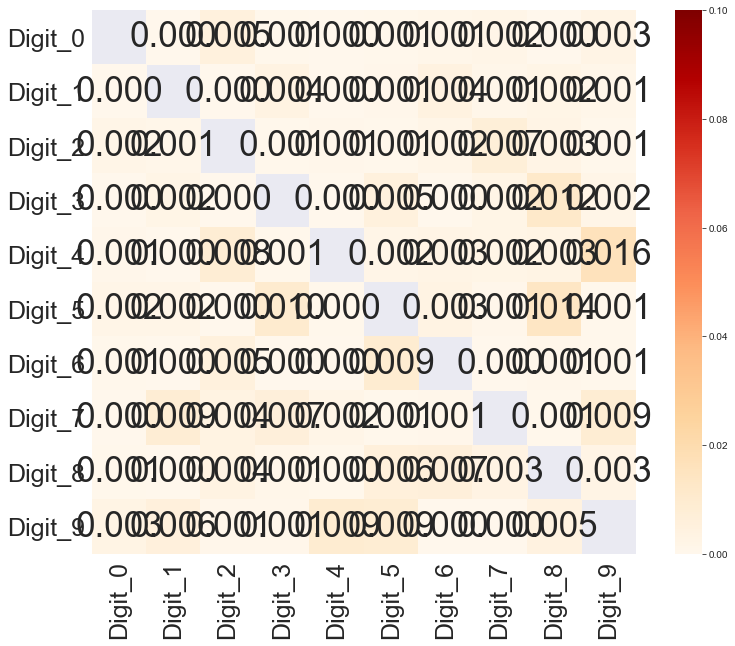

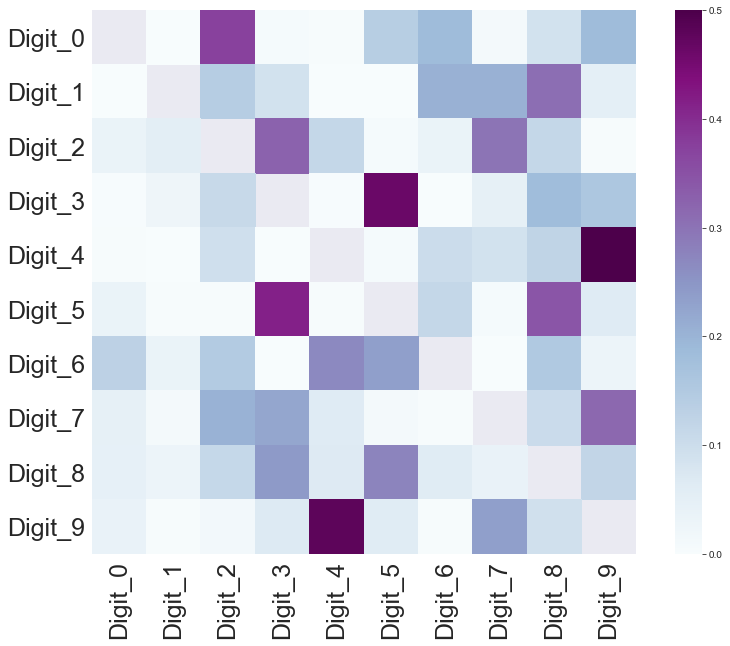

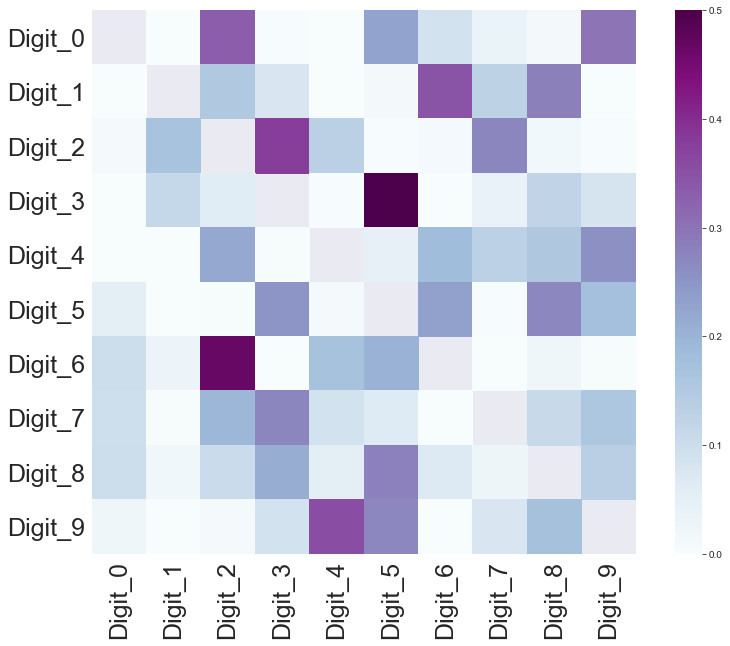

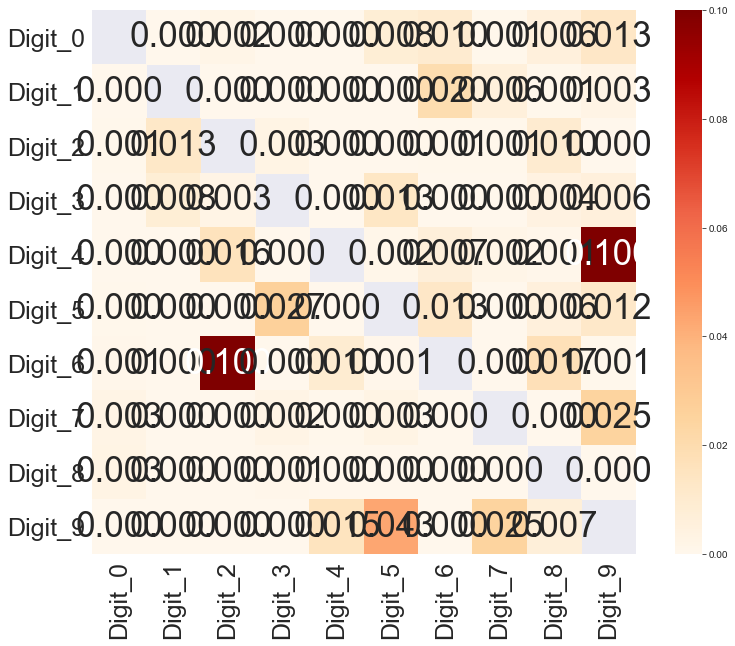

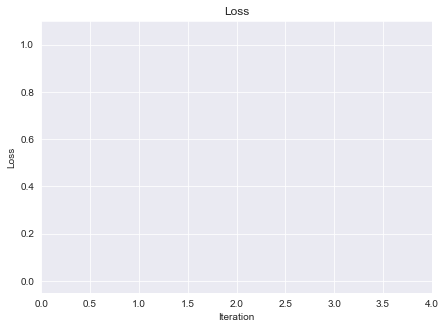

In [34]:
blobs_cp_200 = ClusterPlot(reduce_all_points=False,
                  n_iter=1, 
                  batch_size=0,
                  learning_rate=0.1,
                  dataset='MNISTFull',
                  class_to_label=ds_32_64_200.class_to_label,
                  show_fig=True,
                  save_fig=True,
                  random_state=RANDOM_STATE,
                  show_anchors=False,
                  supervised=False,
                  show_points=False,
                  show_inner_blobs=False,
                  show_polygons=True,
                  show_label_level_plots=True,
                  show_anchor_level_plot=False,
                  save_fig_every=10,
                  annotate_images=False,
                  birch_threshold=3.5,
                  alpha=[
                        1,
                        1,
                        3,
                        3.5,
                        1.5,
                        3.5,
                        2,
                        3.2,
                        3,
                        3,
                    ],
                  douglas_peucker_tolerance=0.5,
                  smooth_iter=3,
                  magnitude_step=False,
                  only_inter_relations=False,
                  mask_relation_in_same_label=True,
                  skip_polygons_with_area = 0.2,
                  umap_min_dist=0.1)
print(blobs_cp_200)
_ = blobs_cp_200.fit_transform(X_32_64_200, y_32_64_200)

Skipping polygon of label 0 with area 0.0009390586832566106
Skipping polygon of label 0 with area 0.0001671871811153025
Skipping polygon of label 1 with area 0.0001671873523911814
Skipping polygon of label 1 with area 0.052677640002079335
Skipping polygon of label 1 with area 0.02357355053517073
Skipping polygon of label 1 with area 0.09362104021259636
Skipping polygon of label 2 with area 0.0001671871811153025
Skipping polygon of label 2 with area 0.0001671871811153025
Skipping polygon of label 2 with area 0.00016718730567957807
Skipping polygon of label 2 with area 0.09104342049028066
Skipping polygon of label 2 with area 0.0001671871811153025
Skipping polygon of label 2 with area 0.026975701463095025
Skipping polygon of label 2 with area 0.0001671871811153025
Skipping polygon of label 2 with area 0.0001671871811153025
Skipping polygon of label 2 with area 0.03878596907808585
Skipping polygon of label 2 with area 0.00016719116717212046
Skipping polygon of label 2 with area 0.00016718

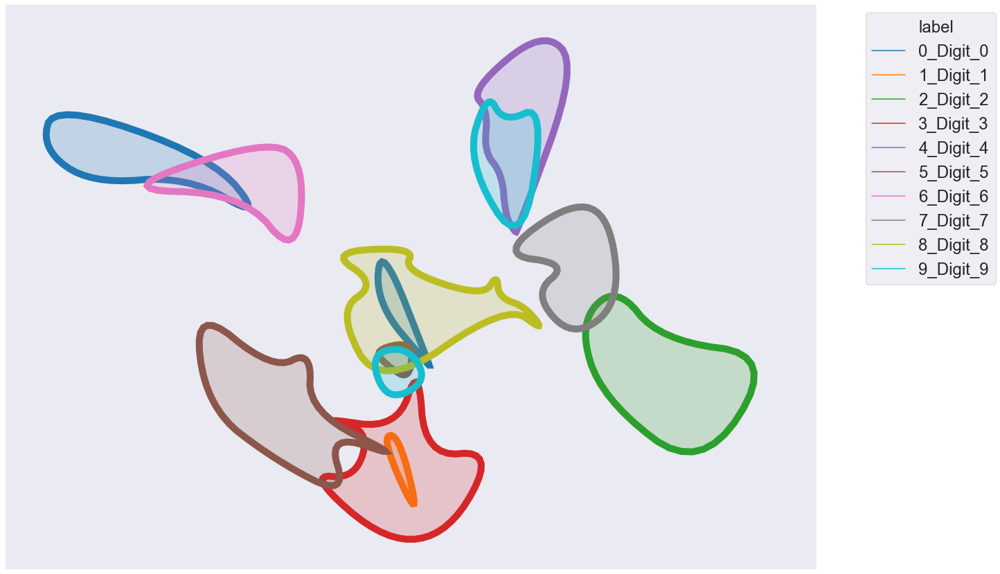

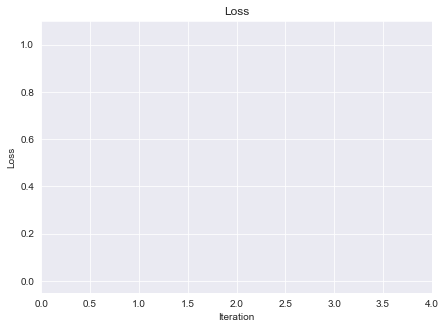

In [31]:
# blobs_cp_200.show_anchors=False
# blobs_cp_200.show_label_level_plots=False
# blobs_cp_200.show_polygons=True
# blobs_cp_200.douglas_peucker_tolerance=0.5
# blobs_cp_200.skip_polygons_with_area=0.2
# blobs_cp_200.alpha = [
#     1,
#     1,
#     3,
#     3.5,
#     1.5,
#     3.5,
#     2,
#     3.2,
#     3,
#     3,
# ]
# blobs_cp_200.anchors_plot_sns_separate(1, True)

## 9 epochs

AMAP
addr:@d79c8
verbose=True
n_components=2
anchors_method='birch'
n_intra_anchors=None
birch_threshold=1
birch_branching_factor=None
dim_reduction_algo='umap'
supervised=False
umap_n_neighbors=15
umap_min_dist=0.1
reduce_all_points=False
uniform_points_per='anchor'
k=20
proximity_k=3
self_relation=False
radius_q=None
do_relaxation=True
top_greedy=1
magnitude_step=False
n_iter=1
batch_size=0
stop_criteria=1e-05
loss_func=<function AMAP.l_inf_loss at 0x000001852ED97EE8>
loss='Linf'
only_inter_relations=False
learning_rate=0.1
mask_sparse_subcluster=None
random_points_method='voronoi'
class_to_label={7: 'Digit_7', 2: 'Digit_2', 1: 'Digit_1', 0: 'Digit_0', 4: 'Digit_4', 9: 'Digit_9', 5: 'Digit_5', 6: 'Digit_6', 3: 'Digit_3', 8: 'Digit_8'}
random_state=42
n_jobs=None
dataset='MNISTFull'
show_fig=True
save_fig=True
is_plotly=False
do_animation=False
use_spline=False
alpha=[2, 0, 3.5, 3.5, 1, 3.7, 1.5, 3, 3.5, 3]
douglas_peucker_tolerance=0.8
smooth_iter=3
skip_polygons_with_area=0.2
mask_r

100%|███████████████████████████████████████████████████████████████████████████| 11496/11496 [01:00<00:00, 191.30it/s]


Starting iteration 1 loss = 1.0
Skipping polygon of label 0 with area 0.0001671871811153025
Skipping polygon of label 0 with area 0.0023610789722323666
Skipping polygon of label 0 with area 0.004235995036863671
Skipping polygon of label 0 with area 0.00016718730567957807
Skipping polygon of label 0 with area 0.005840224958587381
Skipping polygon of label 0 with area 0.08223378859799522
Skipping polygon of label 0 with area 0.0001671871811153025
Skipping polygon of label 2 with area 0.0008570704829151676
Skipping polygon of label 2 with area 0.003902838165862399
Skipping polygon of label 2 with area 0.003680140908371765
Skipping polygon of label 2 with area 0.008031019281832549
Skipping polygon of label 2 with area 0.0001671871811153025
Skipping polygon of label 2 with area 0.0001671871811153025
Skipping polygon of label 2 with area 0.043025574519823945
Skipping polygon of label 2 with area 0.033173840685866464
Skipping polygon of label 2 with area 0.00016718743024385363
Skipping polygo

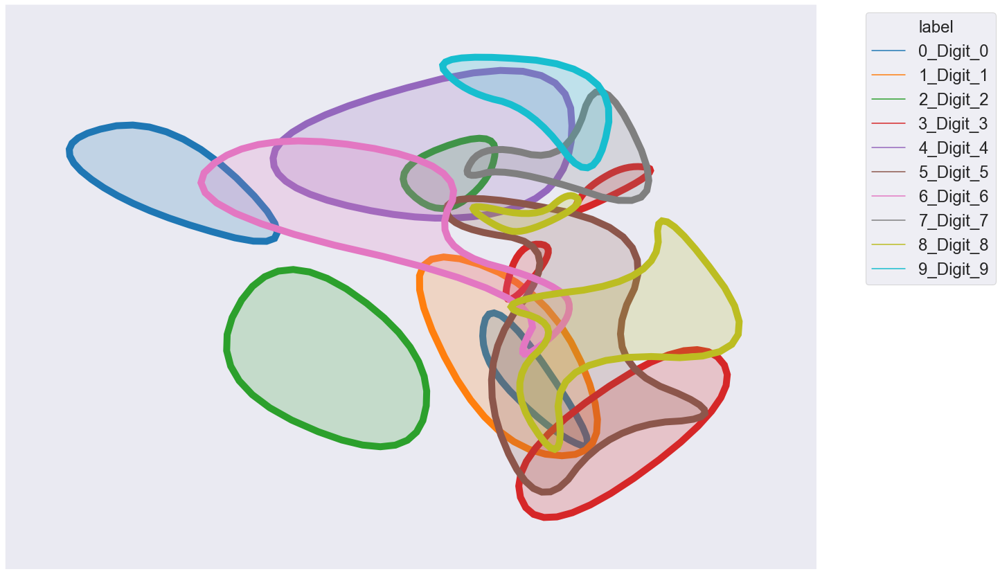

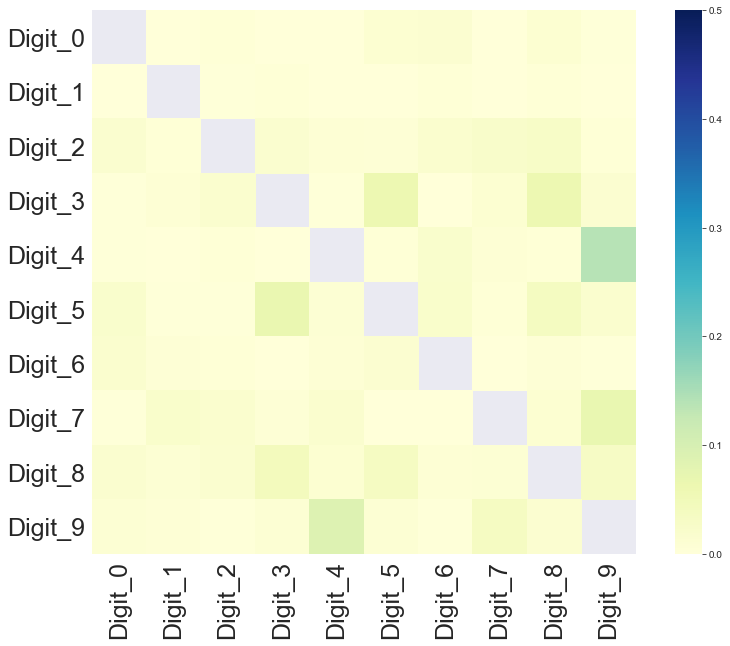

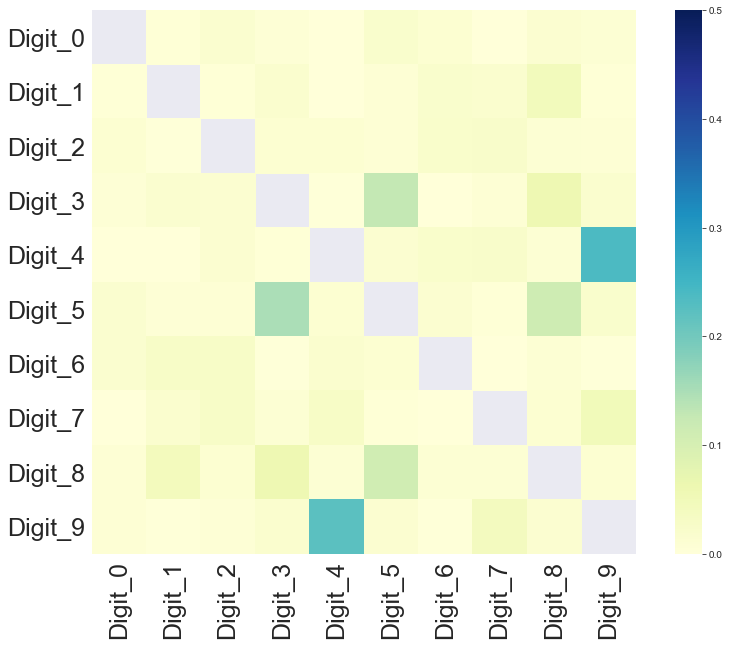

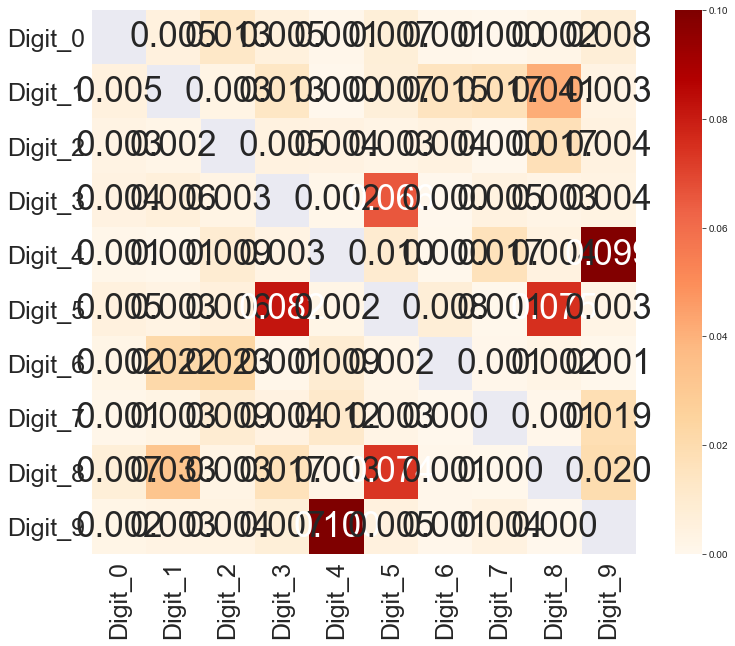

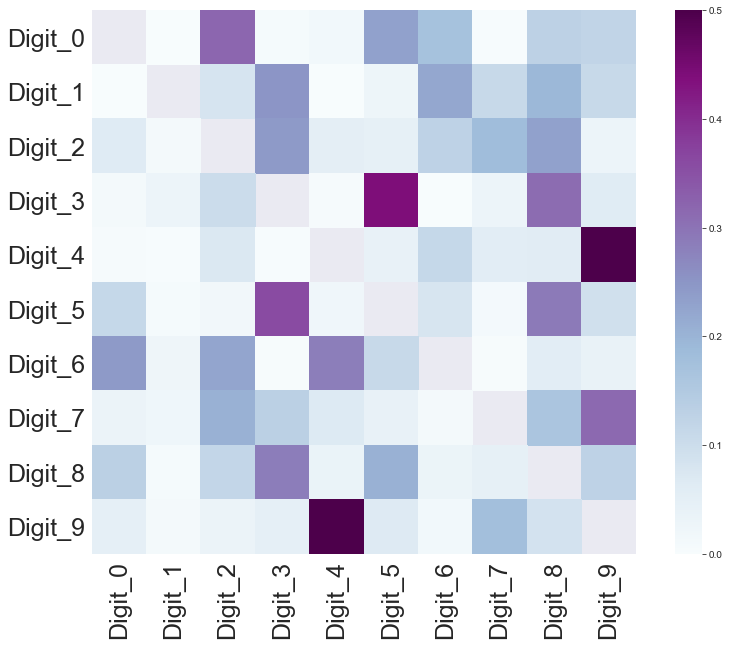

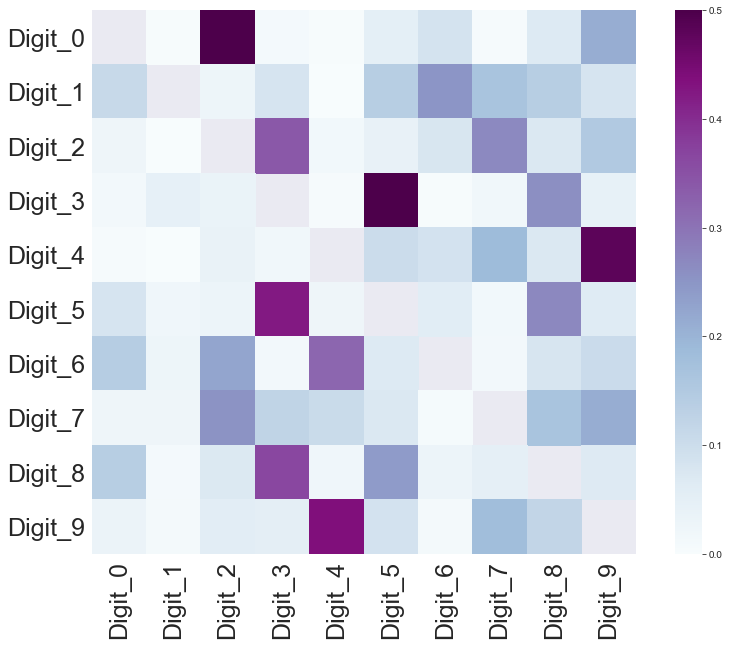

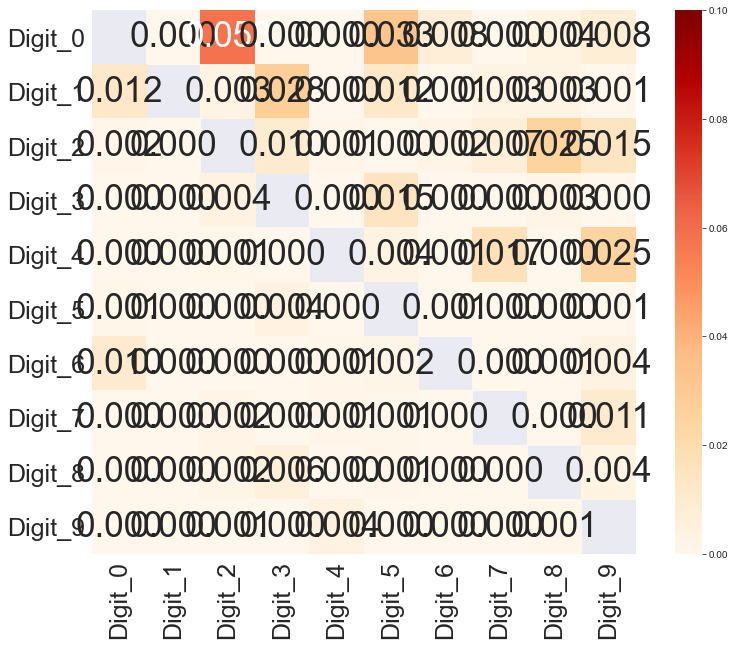

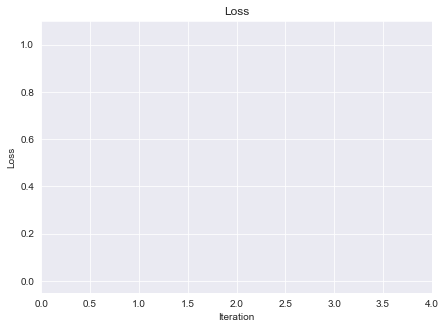

In [36]:
blobs_cp_9 = ClusterPlot(reduce_all_points=False,
                  n_iter=1, 
                  batch_size=0,
                  learning_rate=0.1,
                  dataset='MNISTFull',
                  class_to_label=ds_32_64_9.class_to_label,
                  show_fig=True,
                  save_fig=True,
                  random_state=RANDOM_STATE,
                  show_anchors=False,
                  supervised=False,
                  show_points=False,
                  show_inner_blobs=False,
                  show_polygons=True,
                  show_label_level_plots=True,
                  show_anchor_level_plot=False,
                  save_fig_every=10,
                  annotate_images=False,
                  birch_threshold=1,
                  alpha=[
                        2,
                        0,
                        3.5,
                        3.5,
                        1,
                        3.7,
                        1.5,
                        3,
                        3.5,
                        3,
                    ],
                  douglas_peucker_tolerance=0.8,
                  smooth_iter=3,
                  magnitude_step=False,
                  only_inter_relations=False,
                  mask_relation_in_same_label=True,
                  skip_polygons_with_area = 0.2,
                  umap_min_dist=0.1)
print(blobs_cp_9)
_ = blobs_cp_9.fit_transform(X_32_64_9, y_32_64_9)

In [54]:
blobs_cp_9.num_clusters_each_label

array([170,  12, 283, 216, 110, 192, 115, 110, 208,  80], dtype=int64)

Skipping polygon of label 0 with area 0.0001671871811153025
Skipping polygon of label 0 with area 0.0023610789722323666
Skipping polygon of label 0 with area 0.004235995036863671
Skipping polygon of label 0 with area 0.00016718730567957807
Skipping polygon of label 0 with area 0.005840224958587381
Skipping polygon of label 0 with area 0.08223378859799522
Skipping polygon of label 0 with area 0.0001671871811153025
Skipping polygon of label 2 with area 0.0008570704829151676
Skipping polygon of label 2 with area 0.003902838165862399
Skipping polygon of label 2 with area 0.003680140908371765
Skipping polygon of label 2 with area 0.008031019281832549
Skipping polygon of label 2 with area 0.0001671871811153025
Skipping polygon of label 2 with area 0.0001671871811153025
Skipping polygon of label 2 with area 0.043025574519823945
Skipping polygon of label 2 with area 0.033173840685866464
Skipping polygon of label 2 with area 0.00016718743024385363
Skipping polygon of label 2 with area 0.0001671

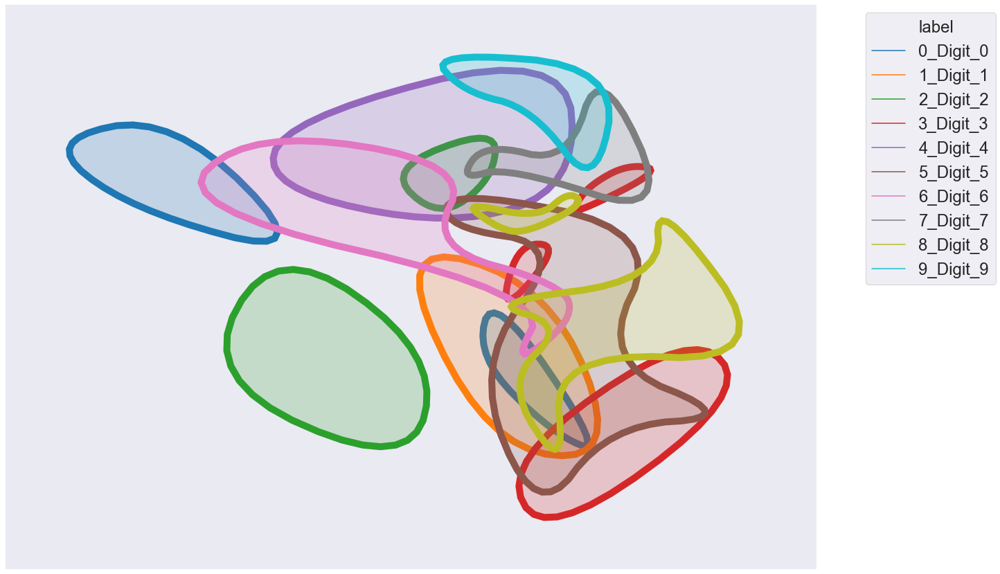

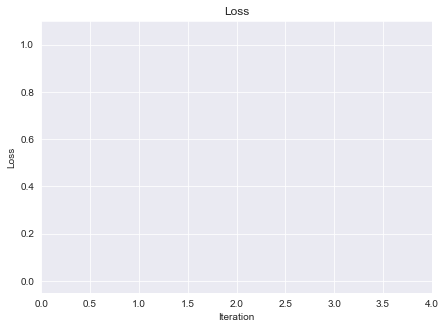

In [76]:
# blobs_cp_9.show_anchors=False
# blobs_cp_9.show_label_level_plots=False
# blobs_cp_9.show_polygons=True
# blobs_cp_9.douglas_peucker_tolerance=0.8
# blobs_cp_9.skip_polygons_with_area=0.2
# blobs_cp_9.alpha = [
#     2,
#     0,
#     3.5,
#     3.5,
#     1,
#     3.7,
#     1.5,
#     3,
#     3.5,
#     3,
# ]
# blobs_cp_9.anchors_plot_sns_separate(1, True)

## 3 epochs

AMAP
addr:@e3f9c8
verbose=True
n_components=2
anchors_method='birch'
n_intra_anchors=None
birch_threshold=0.48
birch_branching_factor=None
dim_reduction_algo='umap'
supervised=False
umap_n_neighbors=15
umap_min_dist=0.1
reduce_all_points=False
uniform_points_per='anchor'
k=20
proximity_k=3
self_relation=False
radius_q=None
do_relaxation=True
top_greedy=1
magnitude_step=False
n_iter=1
batch_size=0
stop_criteria=1e-05
loss_func=<function AMAP.l_inf_loss at 0x0000022CED970C18>
loss='Linf'
only_inter_relations=False
learning_rate=0.1
mask_sparse_subcluster=None
random_points_method='voronoi'
class_to_label={7: 'Digit_7', 2: 'Digit_2', 1: 'Digit_1', 0: 'Digit_0', 4: 'Digit_4', 9: 'Digit_9', 5: 'Digit_5', 6: 'Digit_6', 3: 'Digit_3', 8: 'Digit_8'}
random_state=42
n_jobs=None
dataset='MNISTFull'
show_fig=True
save_fig=True
is_plotly=False
do_animation=False
use_spline=False
alpha=0
douglas_peucker_tolerance=0
smooth_iter=3
skip_polygons_with_area=0.1
mask_relation_in_same_label=True
save_fig_e

100%|████████████████████████████████████████████████████████████████████████████| 10456/10456 [02:22<00:00, 73.36it/s]


Starting iteration 1 loss = 0.875
Skipping polygon of label 1 with area 0.0001671871811153025


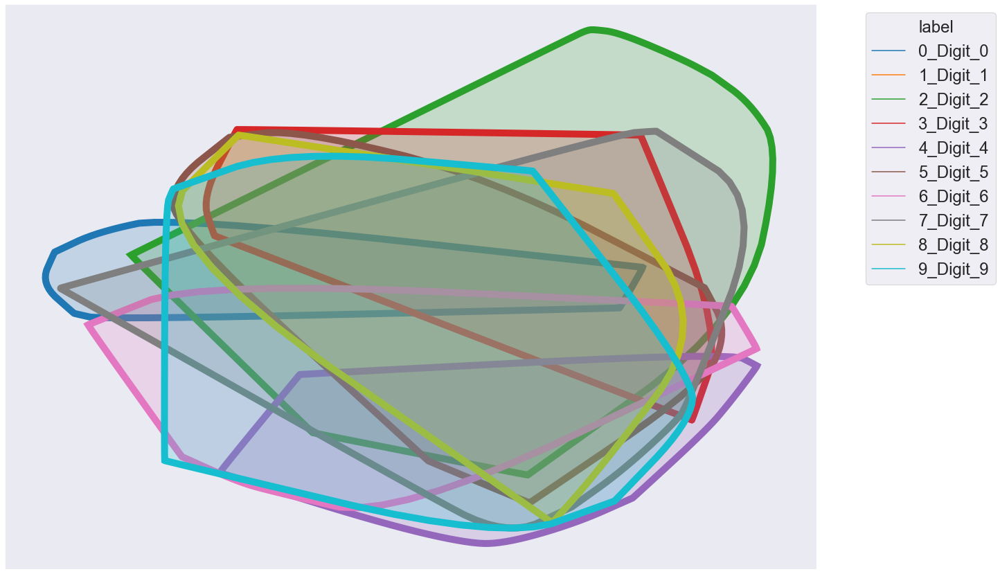

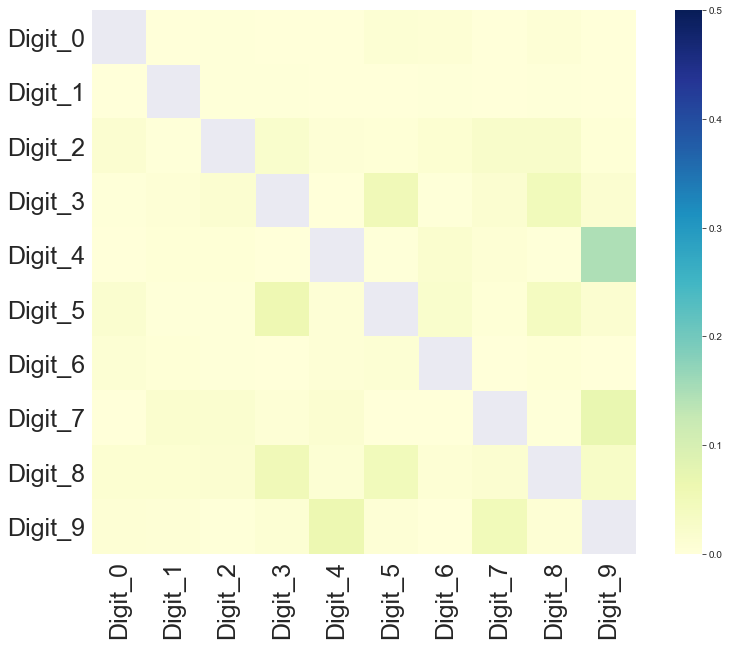

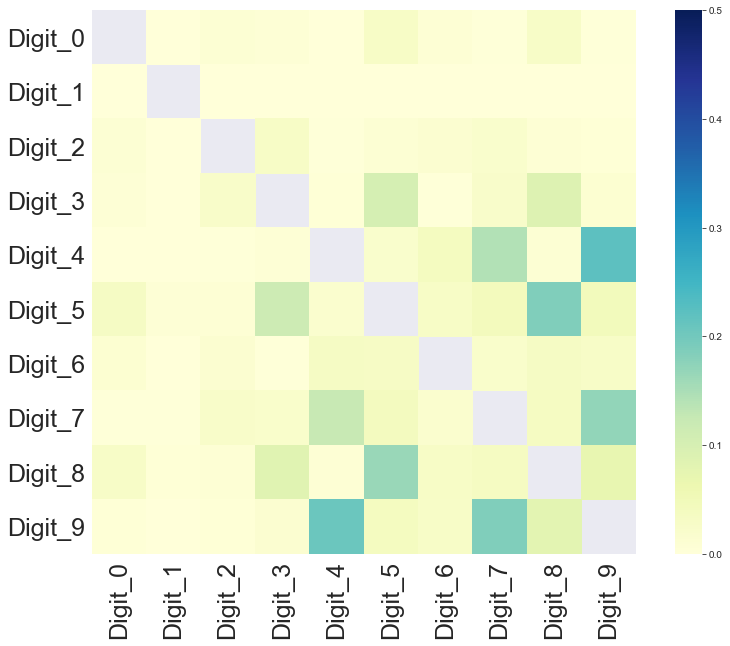

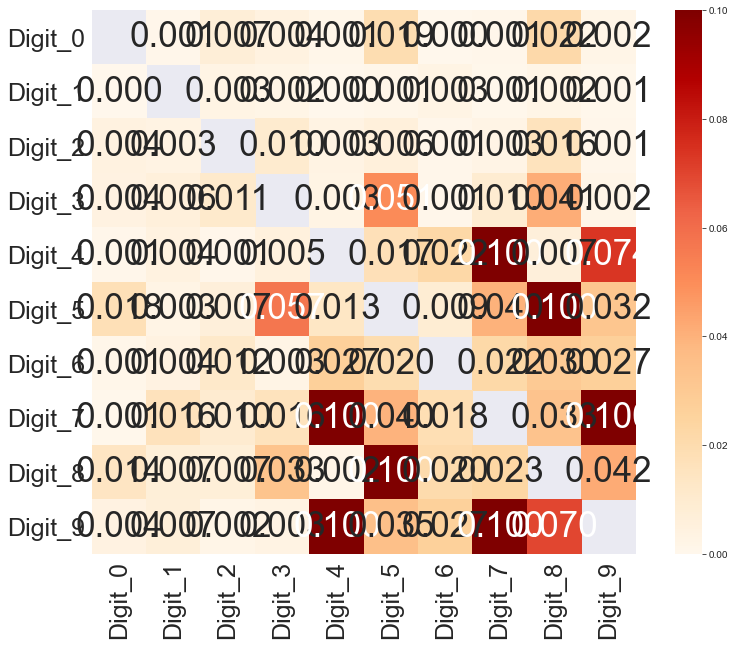

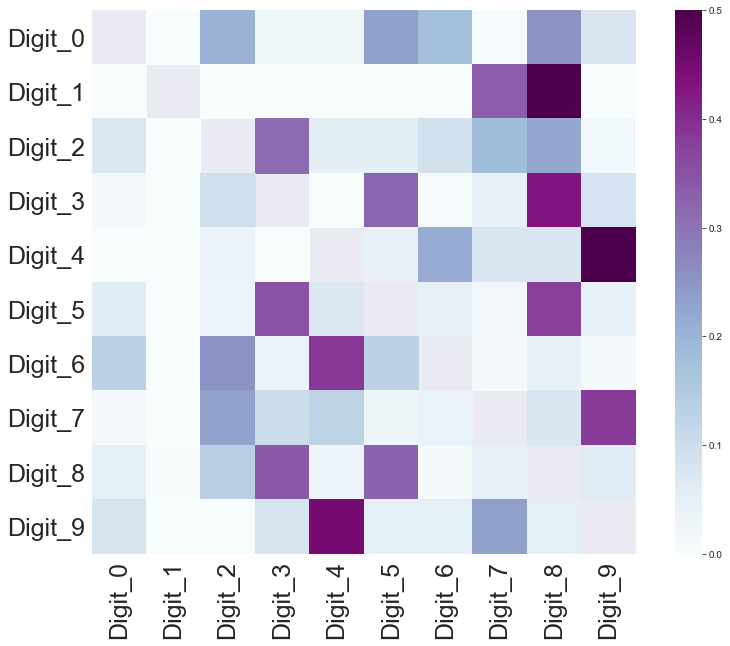

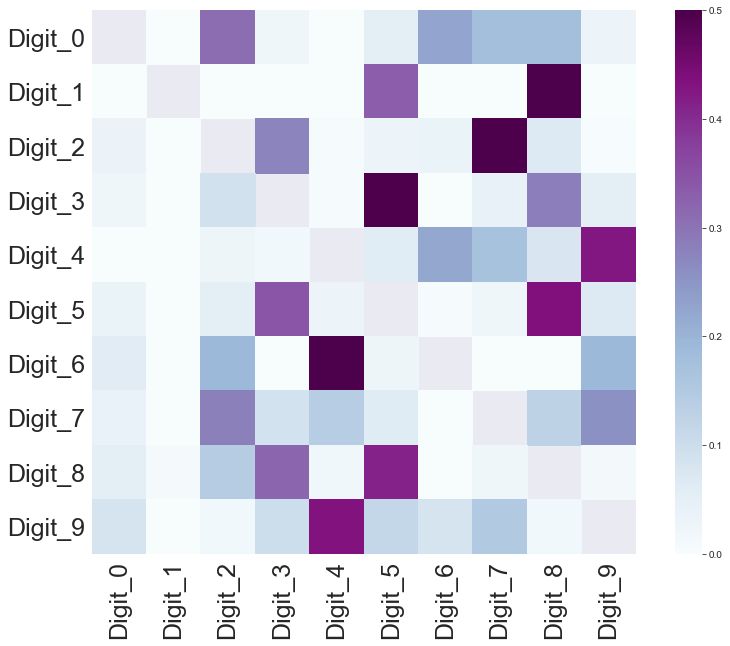

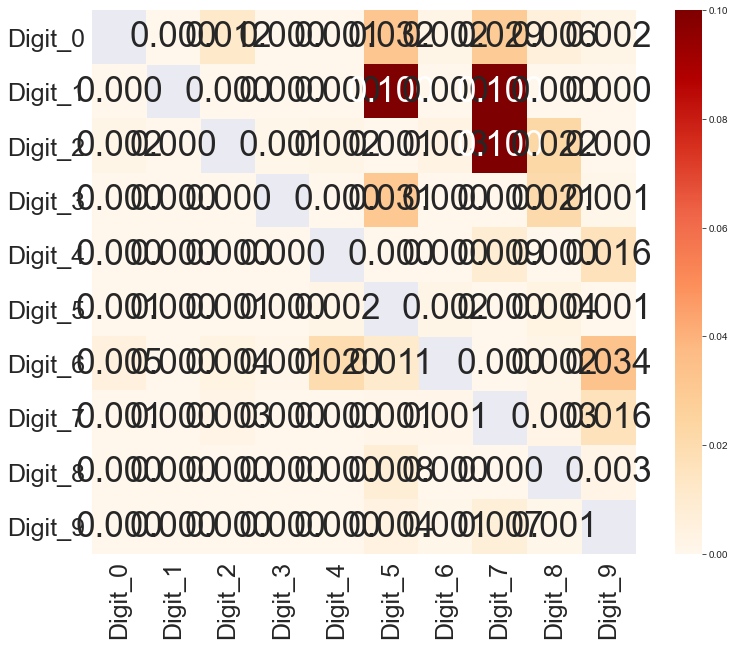

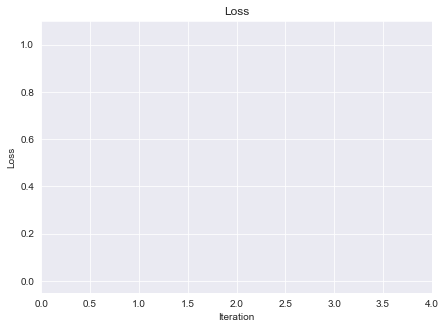

In [17]:
blobs_cp_3 = ClusterPlot(reduce_all_points=False,
                  n_iter=1, 
                  batch_size=0,
                  learning_rate=0.1,
                  dataset='MNISTFull',
                  class_to_label=ds_32_64_3.class_to_label,
                  show_fig=True,
                  save_fig=True,
                  random_state=RANDOM_STATE,
                  show_anchors=False,
                  supervised=False,
                  show_points=False,
                  show_inner_blobs=False,
                  show_polygons=True,
                  show_label_level_plots=True,
                  show_anchor_level_plot=False,
                  save_fig_every=10,
                  annotate_images=False,
                  birch_threshold=0.25,
                  alpha=0,
                  douglas_peucker_tolerance=0,
                  smooth_iter=3,
                  magnitude_step=False,
                  only_inter_relations=False,
                  mask_relation_in_same_label=True,
                  skip_polygons_with_area = 0.1,
                  umap_min_dist=0.1)
print(blobs_cp_3)
_ = blobs_cp_3.fit_transform(X_32_64_3, y_32_64_3)

# Deep Features

In [43]:
ds_32_64 = DataSetFactory.get_dataset('MNIST-DEEP-32-64', random_state=RANDOM_STATE)
ds_2_4 = DataSetFactory.get_dataset('MNIST-DEEP-2-4', random_state=RANDOM_STATE)

In [44]:
X_32_64 = ds_32_64.df[ds_32_64.feature_cols].values
y_32_64 = ds_32_64.df[ds_32_64.label_col].values

X_2_4 = ds_2_4.df[ds_2_4.feature_cols].values
y_2_4 = ds_2_4.df[ds_2_4.label_col].values

In [45]:
X_32_64.shape, X_2_4.shape

((10000, 128), (10000, 128))

(10000, 10000)
(13416493,)


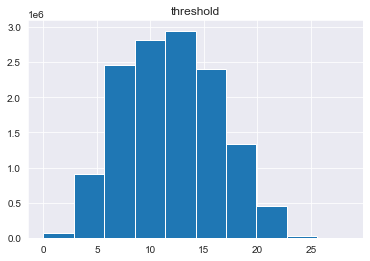

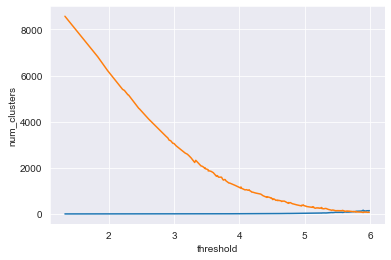

In [107]:
birch_threshold_plot(X_32_64, ds_32_64)

(10000, 10000)
(12877879,)


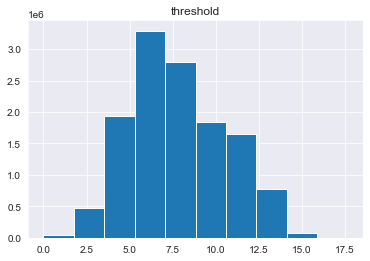

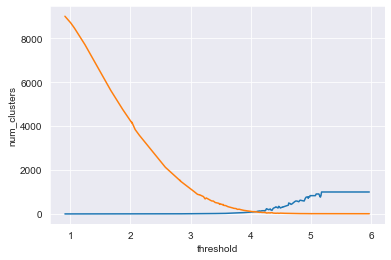

In [108]:
birch_threshold_plot(X_2_4, ds_2_4)

## ClusterPlot 64 32 - 100 EPOCHS

In [48]:
blobs_cp_64_32 = ClusterPlot(reduce_all_points=False,
                  n_iter=1, 
                  batch_size=0,
                  learning_rate=0.1,
                  dataset='MNISTFull',
                  class_to_label=ds.class_to_label,
                  show_fig=True,
                  save_fig=True,
                  random_state=RANDOM_STATE,
                  show_anchors=False,
                  supervised=False,
                  show_points=False,
                  show_inner_blobs=False,
                  show_polygons=True,
                  show_label_level_plots=True,
                  show_anchor_level_plot=False,
                  save_fig_every=10,
                  annotate_images=False,
                  birch_threshold=3,
                  alpha=[
                        1.7,
                        0.8,
                        4.5,
                        3.5,
                        2,
                        2.8,
                        2,
                        2.5,
                        2.5,
                        2.5,
                    ],
                  douglas_peucker_tolerance=0.8,
                  smooth_iter=3,
                  magnitude_step=False,
                  only_inter_relations=False,
                  mask_relation_in_same_label=True,
                  skip_polygons_with_area = 0.1,
                  umap_min_dist=0.1)
print(blobs_cp_64_32)

AMAP
addr:@832148
verbose=True
n_components=2
anchors_method='birch'
n_intra_anchors=None
birch_threshold=3
birch_branching_factor=None
dim_reduction_algo='umap'
supervised=False
umap_n_neighbors=15
umap_min_dist=0.1
reduce_all_points=False
uniform_points_per='anchor'
k=20
proximity_k=3
self_relation=False
radius_q=None
do_relaxation=True
top_greedy=1
magnitude_step=False
n_iter=1
batch_size=0
stop_criteria=1e-05
loss_func=<function AMAP.l_inf_loss at 0x000001852ED97EE8>
loss='Linf'
only_inter_relations=False
learning_rate=0.1
mask_sparse_subcluster=None
random_points_method='voronoi'
class_to_label={8: 'Digit_8', 4: 'Digit_4', 7: 'Digit_7', 0: 'Digit_0', 6: 'Digit_6', 2: 'Digit_2', 3: 'Digit_3', 9: 'Digit_9', 5: 'Digit_5', 1: 'Digit_1'}
random_state=42
n_jobs=None
dataset='MNISTFull'
show_fig=True
save_fig=True
is_plotly=False
do_animation=False
use_spline=False
alpha=[1.7, 0.8, 4.5, 3.5, 2, 2.8, 2, 2.5, 2.5, 2.5]
douglas_peucker_tolerance=0.8
smooth_iter=3
skip_polygons_with_area=0.1

finding intra class anchors using birch
UnSupervised Dim Reduction
Dim Reduction only anchors
Dim Reduction only anchors - generate random points in low dim per anchor


100%|███████████████████████████████████████████████████████████████████████████| 12070/12070 [00:44<00:00, 273.24it/s]


Starting iteration 1 loss = 0.9223684210526315
Skipping polygon of label 0 with area 0.007537887553866755
Skipping polygon of label 0 with area 0.0001671871811153025
Skipping polygon of label 0 with area 0.00016718730567957807
Skipping polygon of label 0 with area 0.00300372460960574
Skipping polygon of label 0 with area 0.0001671871811153025
Skipping polygon of label 1 with area 0.011548526757906236
Skipping polygon of label 1 with area 0.00466974727639391
Skipping polygon of label 2 with area 0.003221895246505735
Skipping polygon of label 2 with area 0.0024187679561569198
Skipping polygon of label 2 with area 0.00016719116717212046
Skipping polygon of label 2 with area 0.00016719116717212046
Skipping polygon of label 2 with area 0.0016784572056245395
Skipping polygon of label 2 with area 0.0017080407924620067
Skipping polygon of label 2 with area 0.00016718743024385363
Skipping polygon of label 2 with area 0.0001671871811153025
Skipping polygon of label 2 with area 0.0001671871811153

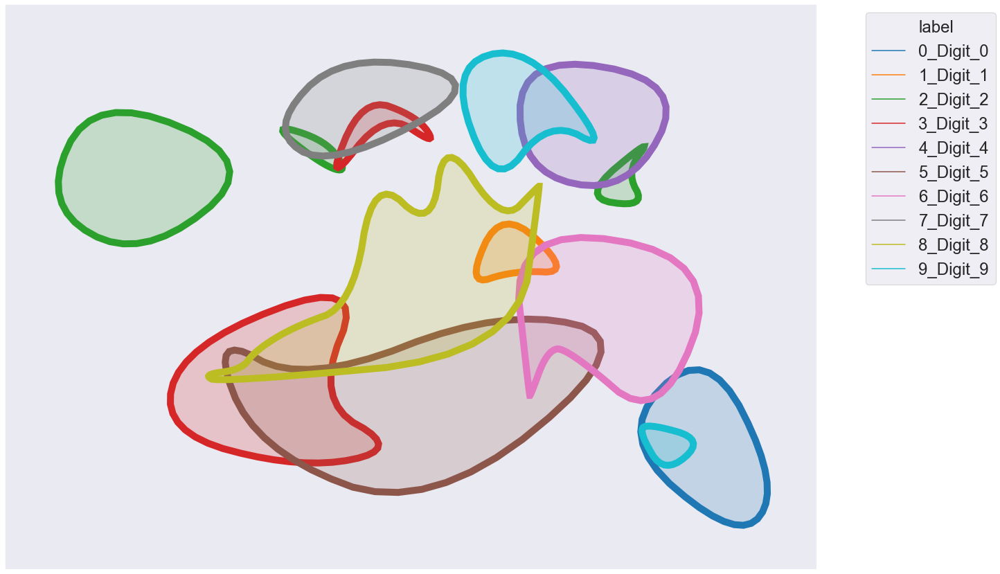

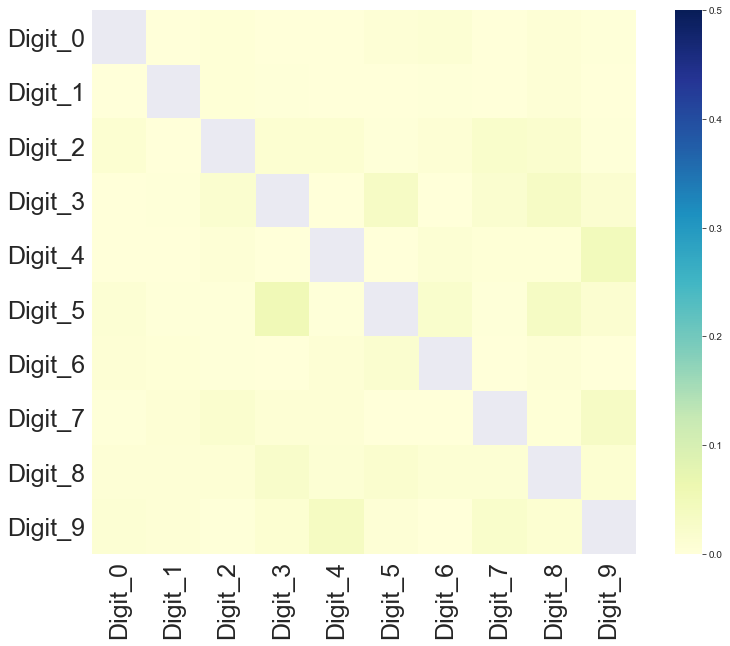

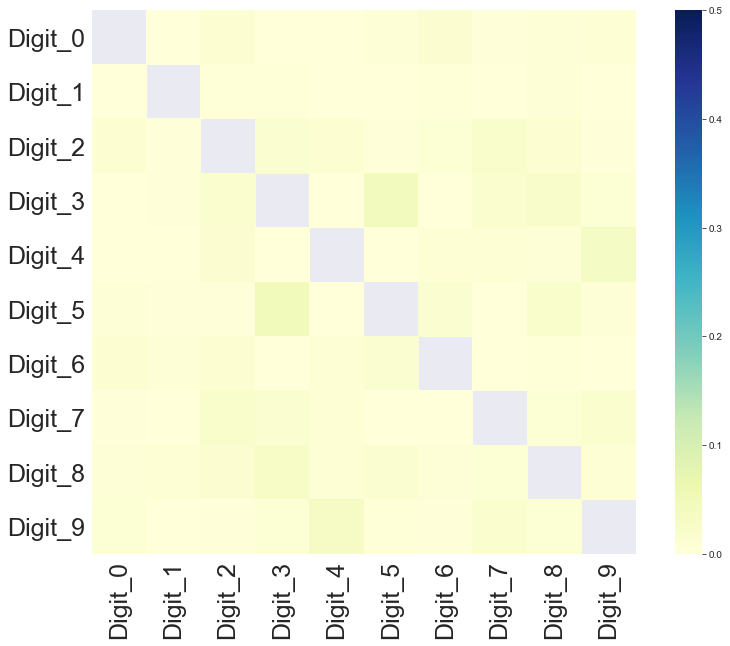

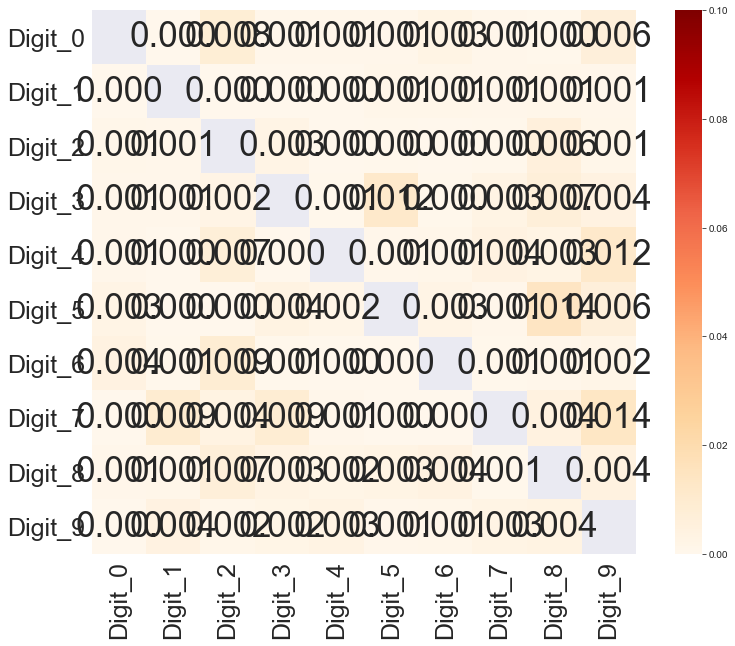

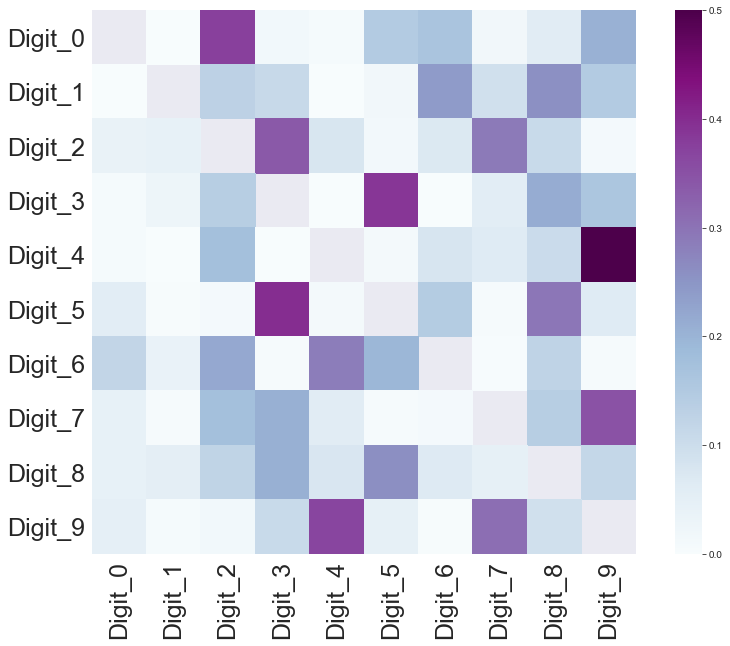

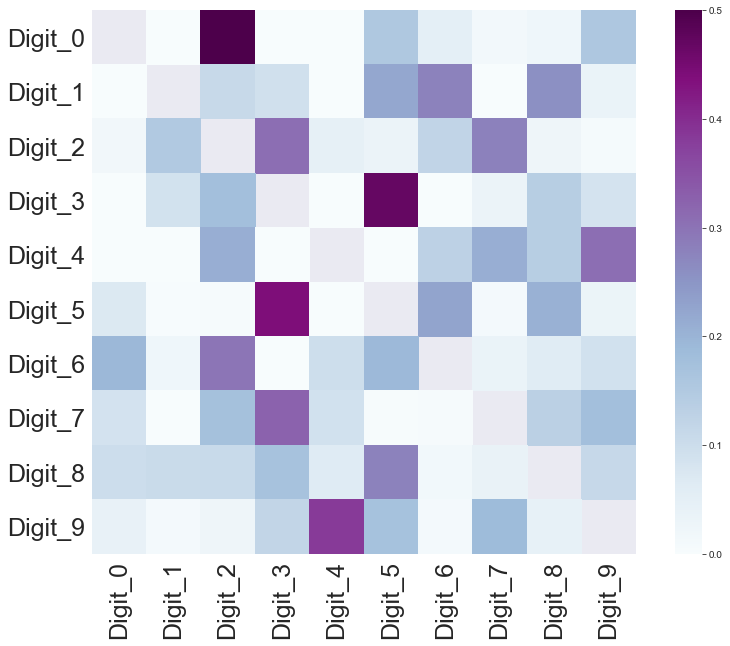

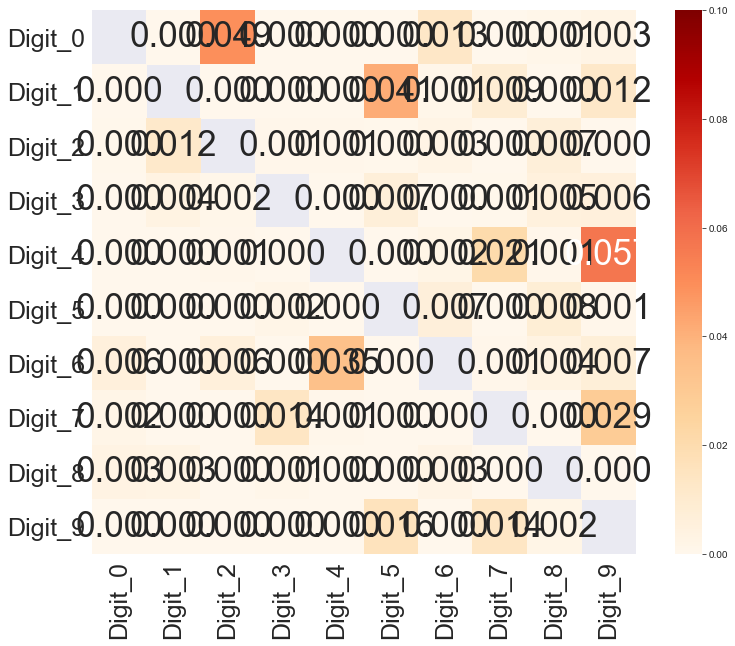

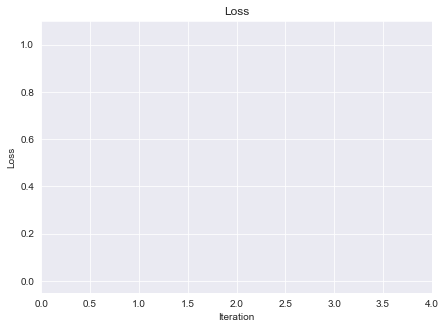

In [49]:
_ = blobs_cp_64_32.fit_transform(X_32_64, y_32_64)

In [116]:
blobs_cp_64_32.num_clusters_each_label

array([213,  18, 382, 299, 187, 303, 161, 168, 212, 127], dtype=int64)

Skipping polygon of label 0 with area 0.007537887553866755
Skipping polygon of label 0 with area 0.0001671871811153025
Skipping polygon of label 0 with area 0.00016718730567957807
Skipping polygon of label 0 with area 0.00300372460960574
Skipping polygon of label 0 with area 0.0001671871811153025
Skipping polygon of label 1 with area 0.011548526757906236
Skipping polygon of label 1 with area 0.00466974727639391
Skipping polygon of label 2 with area 0.003221895246505735
Skipping polygon of label 2 with area 0.0024187679561569198
Skipping polygon of label 2 with area 0.00016719116717212046
Skipping polygon of label 2 with area 0.00016719116717212046
Skipping polygon of label 2 with area 0.0016784572056245395
Skipping polygon of label 2 with area 0.0017080407924620067
Skipping polygon of label 2 with area 0.00016718743024385363
Skipping polygon of label 2 with area 0.0001671871811153025
Skipping polygon of label 2 with area 0.0001671871811153025
Skipping polygon of label 2 with area 0.000

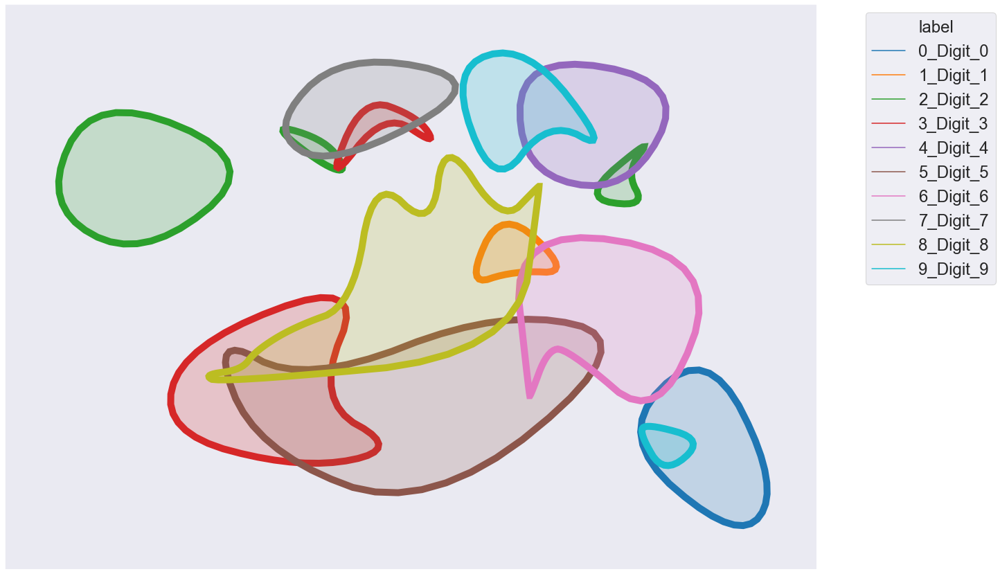

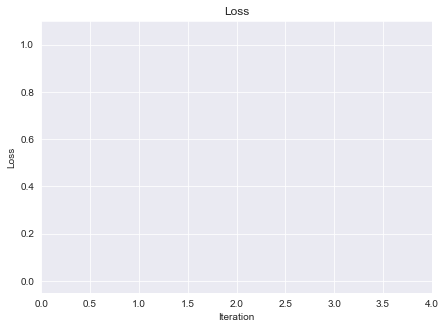

In [151]:
# blobs_cp_64_32.show_anchors=False
# blobs_cp_64_32.show_label_level_plots=False
# blobs_cp_64_32.show_polygons=True
# blobs_cp_64_32.douglas_peucker_tolerance=0.8
# blobs_cp_64_32.alpha = [
#     1.7,
#     0.8,
#     4.5,
#     3.5,
#     2,
#     2.8,
#     2,
#     2.5,
#     2.5,
#     2.5,
# ]
# blobs_cp_64_32.anchors_plot_sns_separate(1, True)

## ClusterPlot 4 2

In [118]:
blobs_cp_4_2 = ClusterPlot(reduce_all_points=False,
                  n_iter=1, 
                  batch_size=0,
                  learning_rate=0.1,
                  dataset='MNISTFull',
                  class_to_label=ds.class_to_label,
                  show_fig=True,
                  save_fig=True,
                  random_state=RANDOM_STATE,
                  show_anchors=False,
                  supervised=False,
                  show_points=False,
                  show_inner_blobs=False,
                  show_polygons=True,
                  show_label_level_plots=True,
                  show_anchor_level_plot=False,
                  save_fig_every=10,
                  annotate_images=False,
                  birch_threshold=2.3,
                  alpha=0,
                  douglas_peucker_tolerance=0,
                  smooth_iter=3,
                  magnitude_step=False,
                  only_inter_relations=False,
                  mask_relation_in_same_label=True,
                  skip_polygons_with_area = 0.1,
                  umap_min_dist=0.1)
print(blobs_cp_4_2)

AMAP
addr:@d2ce88
verbose=True
n_components=2
anchors_method='birch'
n_intra_anchors=None
birch_threshold=2.3
birch_branching_factor=None
dim_reduction_algo='umap'
supervised=False
umap_n_neighbors=15
umap_min_dist=0.1
reduce_all_points=False
uniform_points_per='anchor'
k=20
proximity_k=3
self_relation=False
radius_q=None
do_relaxation=True
top_greedy=1
magnitude_step=False
n_iter=1
batch_size=0
stop_criteria=1e-05
loss_func=<function AMAP.l_inf_loss at 0x0000021E934E7CA8>
loss='Linf'
only_inter_relations=False
learning_rate=0.1
mask_sparse_subcluster=None
random_points_method='voronoi'
class_to_label={8: 'Digit_8', 4: 'Digit_4', 7: 'Digit_7', 0: 'Digit_0', 6: 'Digit_6', 2: 'Digit_2', 3: 'Digit_3', 9: 'Digit_9', 5: 'Digit_5', 1: 'Digit_1'}
random_state=42
n_jobs=None
dataset='MNISTFull'
show_fig=True
save_fig=True
is_plotly=False
do_animation=False
use_spline=False
alpha=0
douglas_peucker_tolerance=0
smooth_iter=3
skip_polygons_with_area=0.1
mask_relation_in_same_label=True
save_fig_ev

finding intra class anchors using birch
UnSupervised Dim Reduction
Dim Reduction only anchors
Dim Reduction only anchors - generate random points in low dim per anchor


100%|███████████████████████████████████████████████████████████████████████████| 12132/12132 [00:58<00:00, 206.77it/s]


Starting iteration 1 loss = 0.8695652173913043


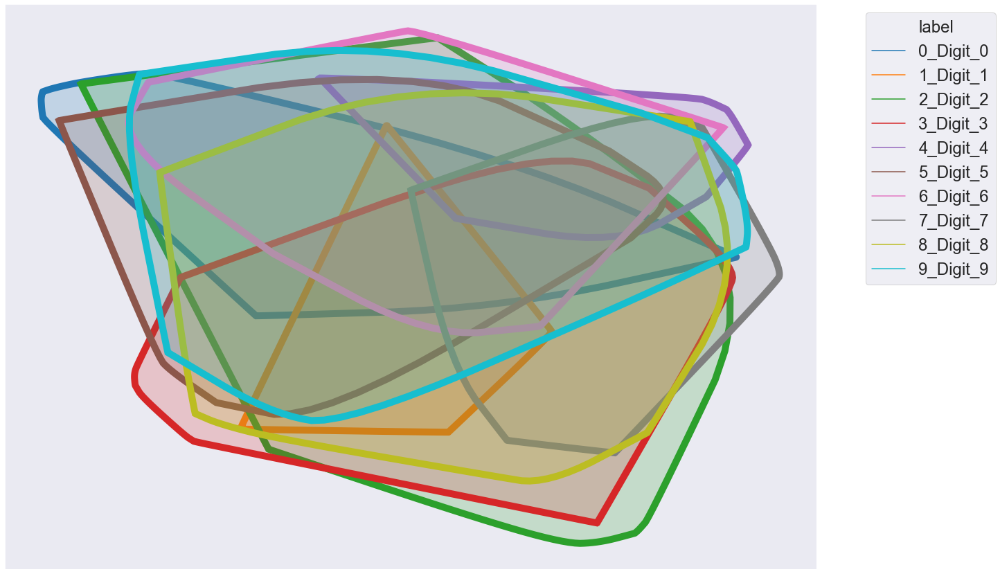

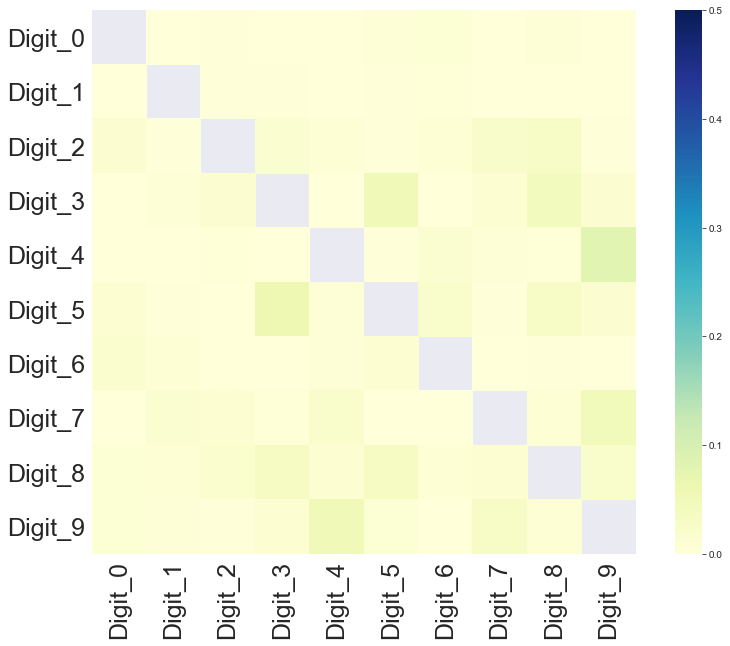

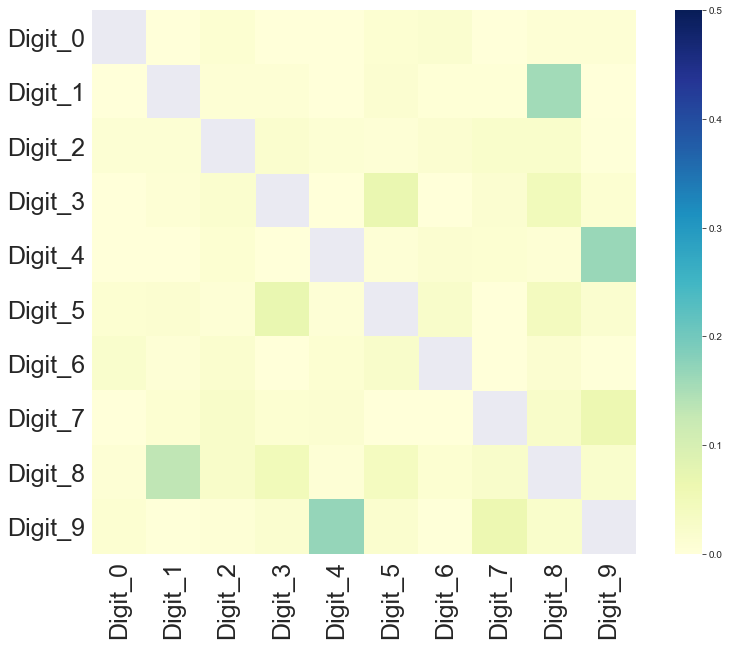

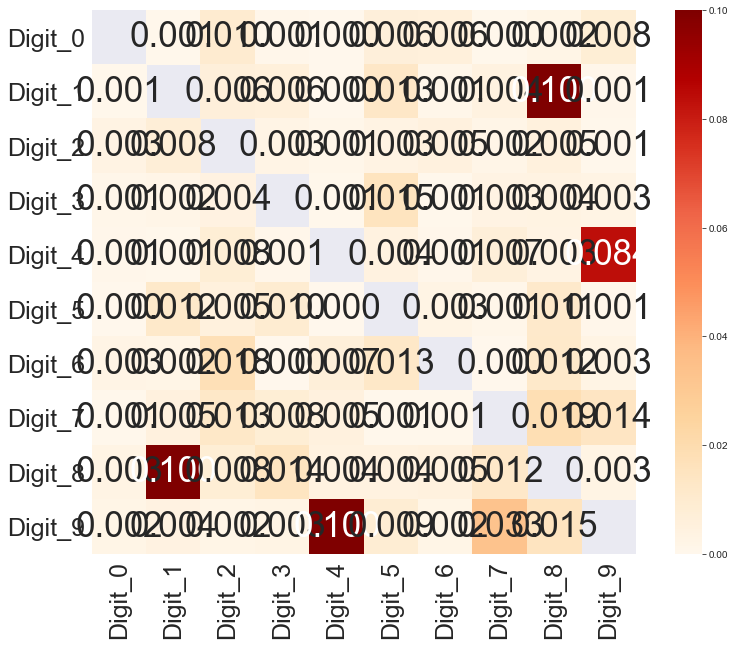

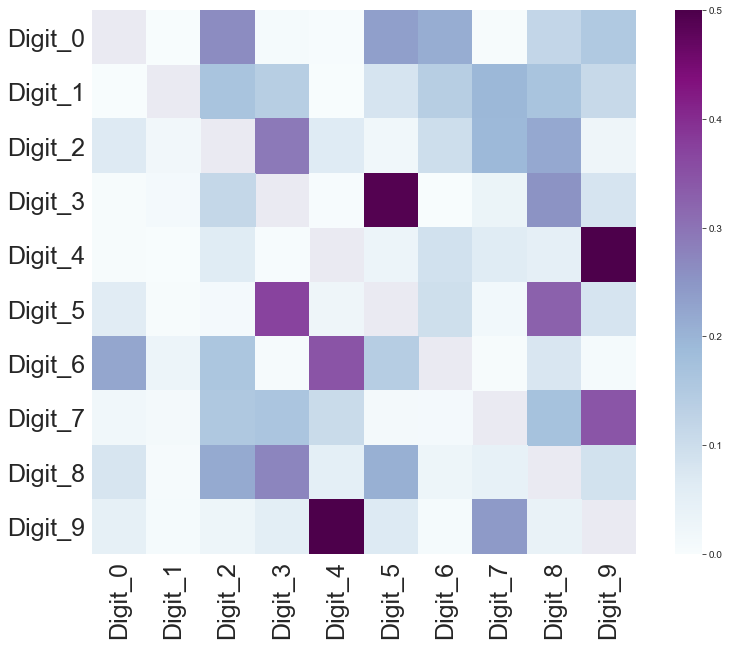

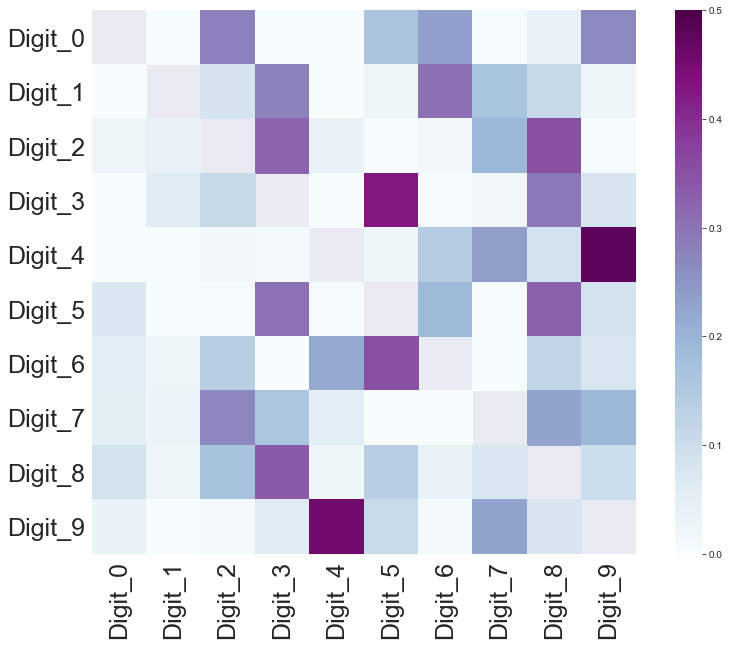

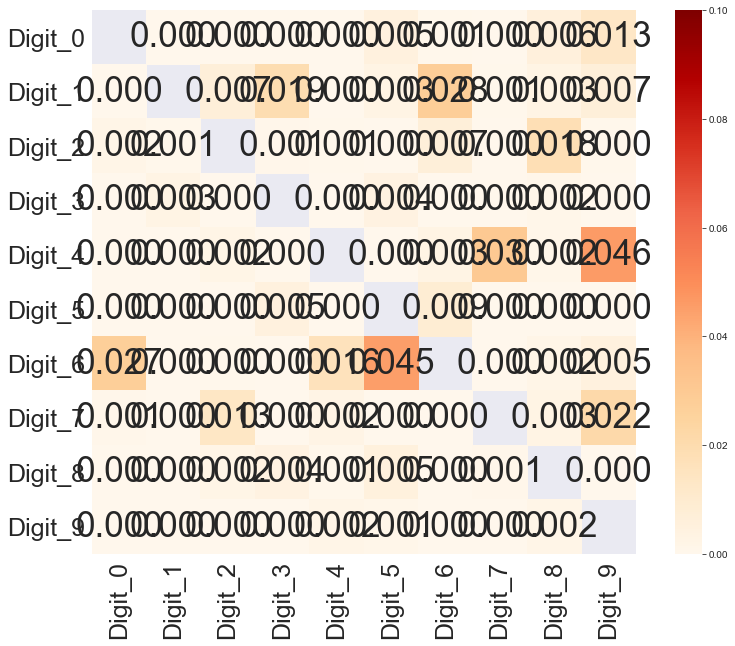

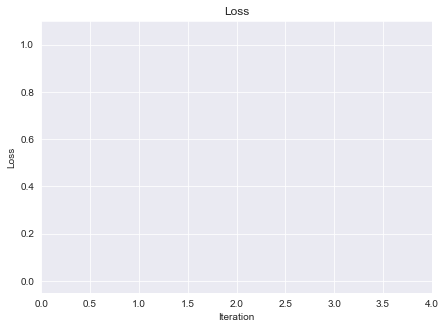

In [119]:
_ = blobs_cp_4_2.fit_transform(X_2_4, y_2_4)

In [120]:
blobs_cp_4_2.num_clusters_each_label

array([183,  12, 416, 301, 189, 289, 155, 156, 312, 119], dtype=int64)

Skipping polygon of label 0 with area 0.013051991529993638
Skipping polygon of label 0 with area 0.06033973427950449
Skipping polygon of label 0 with area 0.0001671871811153025
Skipping polygon of label 0 with area 0.00476828621329763
Skipping polygon of label 0 with area 0.0001671871811153025
Skipping polygon of label 1 with area 0.0001671871811153025
Skipping polygon of label 2 with area 0.004214102616305282
Skipping polygon of label 2 with area 0.08488360126436262
Skipping polygon of label 2 with area 0.004673441136562465
Skipping polygon of label 2 with area 0.003435657427005918
Skipping polygon of label 2 with area 0.0009961268095906584
Skipping polygon of label 2 with area 0.0001671871811153025
Skipping polygon of label 2 with area 0.029945958979843867
Skipping polygon of label 2 with area 0.0001671871811153025
Skipping polygon of label 2 with area 0.0001671951533239735
Skipping polygon of label 2 with area 0.00016719116717212046
Skipping polygon of label 2 with area 0.0001671911

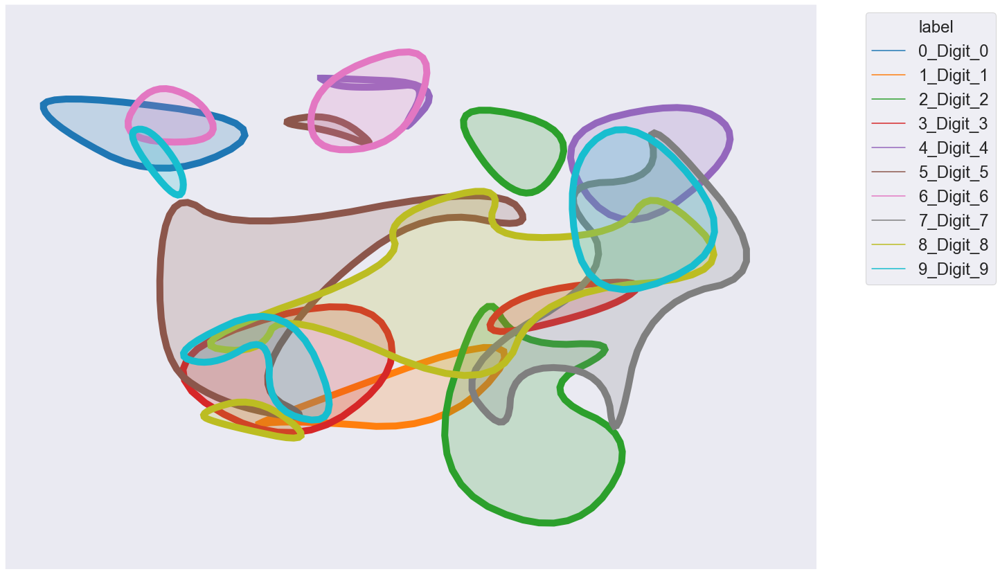

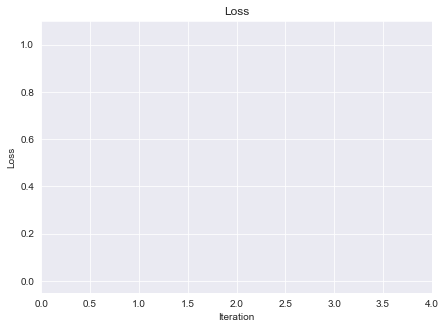

In [153]:
blobs_cp_4_2.show_anchors=False
blobs_cp_4_2.show_label_level_plots=False
blobs_cp_4_2.show_polygons=True
blobs_cp_4_2.douglas_peucker_tolerance=0.8
blobs_cp_4_2.alpha = [
    1.5,
    0.8,
    3,
    2.5,
    2,
    2,
    2,
    1.8,
    2.5,
    2,
]
blobs_cp_4_2.anchors_plot_sns_separate(1, True)